# Librerie

In [1]:
import timm

from MultiViT import MultiViT
from ViT import ViT
from TopK import TopKViT
from PatchMergerViT import PatchMergerViT
from ATSViT import ATSViT

# Import e path

In [2]:
models_save_path = "../../Models/"
results_save_path = "../../Results/"
dataset_path = "../../Datasets/"

In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch import optim, nn
from torch.nn import functional
import os
import time
import csv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shutil
from torchvision.utils import make_grid
from random import randint
from PIL import Image
import random

from einops import rearrange
from einops.layers.torch import Rearrange

import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

<h3> Validi per ogni modello

In [4]:
def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

set_seed(42)

In [5]:
# Verifica se la GPU è disponibile
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

# Funzioni per train e validation del modello

<h3> Funzione per il Training

In [6]:
def train_iter(model, optimz, data_load, loss_val, device):
    samples = len(data_load.dataset)
    model.train()

    for i, (data, target) in enumerate(data_load):
        data = data.to(device)
        target = target.to(device)

        optimz.zero_grad()
        out = functional.log_softmax(model(data), dim=1)
        loss = functional.nll_loss(out, target)
        loss.backward()
        optimz.step()

        if i % 100 == 0:
            print('[' +  '{:5}'.format(i * len(data)) + '/' + '{:5}'.format(samples) +
                  ' (' + '{:3.0f}'.format(100 * i / len(data_load)) + '%)]  Loss: ' +
                  '{:6.4f}'.format(loss.item()))
    loss_val.append(loss.item())

<h3> Funzione per la validation

In [7]:
def evaluate(model, optimizer, data_load, loss_val, device):
    model.eval()

    samples = len(data_load.dataset)
    # predizioni corrette
    csamp = 0
    tloss = 0

    with torch.no_grad():
        for data, target in data_load:

            data = data.to(device)
            target = target.to(device)

            output = functional.log_softmax(model(data), dim=1)
            loss = functional.nll_loss(output, target, reduction='sum')
            _, pred = torch.max(output, dim=1)

            tloss += loss.item()
            csamp += pred.eq(target).sum()

    aloss = tloss / samples
    loss_val.append(aloss)
    acc = (100.0 * csamp / samples).cpu()

    print('\nAverage test loss: ' + '{:.4f}'.format(aloss) +
          '  Accuracy:' + '{:5}'.format(csamp) + '/' +
          '{:5}'.format(samples) + ' (' +
          '{:4.2f}'.format(acc) + '%)\n')

    return acc

<h3> Funzione per allenare e validare il modello

In [8]:
def train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device):
  tr_loss, ts_loss, ts_acc, epoch_time_list = [], [], [], []

  for epoch in range(1, epoche + 1):

      start_time = time.time()

      print(f'Epoch: {epoch}/{epoche}')
      print("INIZIO TRAINING")
      train_iter(model, optimizer, train_loader, tr_loss, device)
      print("INIZIO VALIDATION")
      acc = evaluate(model, optimizer, validation_loader, ts_loss, device)

      if (not ts_acc or acc >= max(ts_acc)):
        checkpoint = {'model_state_dict': model.state_dict(),
                      'optimizer_state_dict': optimizer.state_dict(),
                      'train_loss_state_dict': tr_loss[-1],
                      'val_loss_state_dict': ts_loss[-1],
                      'val_acc_state_dict': acc
                      }
        print(f'Saving Best Accuracy Model')
        torch.save(checkpoint, f'{models_save_path}{nome_file}')
        print(f'End of Saving \n')

      ts_acc.append(acc)


      epoch_time = time.time() - start_time
      epoch_time_list.append(epoch_time)

      print('Execution time:', '{:5.2f}'.format(epoch_time), 'seconds')
      print("#"*40)

  return tr_loss, ts_loss, ts_acc, epoch_time_list

# Funzioni per importare i pesi

In [9]:
def get_weights(modello, n_patch, num_classes, model_timm, dim, heads):

    # Definizione dei parametri del modello ViT
    image_size = 224
    patch_size = 16
    depth = 12
    mlp_dim = dim * 4

    # Creazione del modello ViT utilizzando vit_pytorch
    if modello == 'MultiViT':

        model_vit = MultiViT(
            image_size=image_size,
            patch_size=patch_size,
            num_classes=num_classes,
            dim=dim,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            n_patch = n_patch
        )

    elif modello == 'ATSViT':

        model_vit = ATSViT(
            image_size=image_size,
            patch_size=patch_size,
            num_classes=num_classes,
            dim=dim,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            max_tokens_per_depth = n_patch
        )

    elif modello == 'PatchMergerViT':

        model_vit = PatchMergerViT(
            image_size=image_size,
            patch_size=patch_size,
            num_classes=num_classes,
            dim=dim,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            patch_merge_layers = n_patch
        )

    elif modello == 'TopKViT':

        model_vit = TopKViT(
            image_size=image_size,
            patch_size=patch_size,
            num_classes=num_classes,
            dim=dim,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
            n_patch = n_patch
        )

    elif modello == 'ViT':

        model_vit = ViT(
            image_size=image_size,
            patch_size=patch_size,
            num_classes=num_classes,
            dim=dim,
            depth=depth,
            heads=heads,
            mlp_dim=mlp_dim,
        )

    # Ottieni i pesi del modello
    model_timm_weights = model_timm.state_dict()

    # Ottieni i pesi del modello
    model_vit_weights = model_vit.state_dict()


    i = 0

    for elem_timm, elem_vit in zip(model_timm.blocks, model_vit.transformer.layers):
        model_timm_weights[f'transformer.layers.{i}.0.norm.weight'] = model_timm_weights.pop(f'blocks.{i}.norm1.weight')
        model_timm_weights[f'transformer.layers.{i}.0.norm.bias'] = model_timm_weights.pop(f'blocks.{i}.norm1.bias')

        model_timm_weights[f'transformer.layers.{i}.0.to_qkv.weight'] = model_timm_weights.pop(f'blocks.{i}.attn.qkv.weight')
        model_timm_weights.pop(f'blocks.{i}.attn.qkv.bias')

        model_timm_weights[f'transformer.layers.{i}.0.to_out.0.weight'] = model_timm_weights.pop(f'blocks.{i}.attn.proj.weight')
        model_timm_weights[f'transformer.layers.{i}.0.to_out.0.bias'] = model_timm_weights.pop(f'blocks.{i}.attn.proj.bias')


        model_timm_weights[f'transformer.layers.{i}.1.net.0.weight'] = model_timm_weights.pop(f'blocks.{i}.norm2.weight')
        model_timm_weights[f'transformer.layers.{i}.1.net.0.bias'] = model_timm_weights.pop(f'blocks.{i}.norm2.bias')

        model_timm_weights[f'transformer.layers.{i}.1.net.1.weight'] = model_timm_weights.pop(f'blocks.{i}.mlp.fc1.weight')
        model_timm_weights[f'transformer.layers.{i}.1.net.1.bias'] = model_timm_weights.pop(f'blocks.{i}.mlp.fc1.bias')

        model_timm_weights[f'transformer.layers.{i}.1.net.4.weight'] = model_timm_weights.pop(f'blocks.{i}.mlp.fc2.weight')
        model_timm_weights[f'transformer.layers.{i}.1.net.4.bias'] = model_timm_weights.pop(f'blocks.{i}.mlp.fc2.bias')

        i += 1

    model_timm_weights[f'mlp_head.weight'] = model_timm_weights.pop(f'head.weight')
    model_timm_weights[f'mlp_head.bias'] = model_timm_weights.pop(f'head.bias')

    model_timm_weights[f'transformer.norm.weight'] = model_timm_weights.pop(f'norm.weight')
    model_timm_weights[f'transformer.norm.bias'] = model_timm_weights.pop(f'norm.bias')

    model_timm_weights[f'pos_embedding'] = model_timm_weights.pop(f'pos_embed')

    if modello == 'PatchMergerViT':
        for elem in ["cls_token", "mlp_head.weight", "mlp_head.bias"]:
            model_timm_weights.pop(elem)
        for elem in ["transformer.patch_mergers.2.queries", "transformer.patch_mergers.2.norm.weight", "transformer.patch_mergers.2.norm.bias", "transformer.patch_mergers.5.queries", "transformer.patch_mergers.5.norm.weight", "transformer.patch_mergers.5.norm.bias", "transformer.patch_mergers.8.queries", "transformer.patch_mergers.8.norm.weight", "transformer.patch_mergers.8.norm.bias", "mlp_head.1.weight", "mlp_head.1.bias"]:
            model_timm_weights[elem] = model_vit_weights[elem]

    if modello == 'ATSViT':
        model_timm_weights["mlp_head.0.weight"] = model_timm_weights.pop('transformer.norm.weight')
        model_timm_weights["mlp_head.0.bias"] = model_timm_weights.pop("transformer.norm.bias")
        model_timm_weights["mlp_head.1.weight"] = model_timm_weights.pop("mlp_head.weight")
        model_timm_weights["mlp_head.1.bias"] = model_timm_weights.pop("mlp_head.bias")

    model_vit.load_state_dict(model_timm_weights)


    return model_vit

# Funzioni per il dataloader

<h3> Funzione per creare il dataloader in base al tipo di split

In [10]:
import os
from PIL import Image
from torch.utils.data import Dataset

class MyDataset(Dataset):
    def __init__(self, root_dir, split="train", transform=None):

        self.root_dir = root_dir
        self.split = split
        self.transform = transform
        self.class_folders = [f.path for f in os.scandir(self.root_dir) if f.is_dir()]
        self.image_paths = []
        self.labels = []

        class_to_label = {class_name: i for i, class_name in enumerate(self.class_folders)}

        for class_folder, class_label in class_to_label.items():

            if self.split == "train":
              image_folder_path = os.path.join(class_folder, "images")
              image_filenames = os.listdir(image_folder_path)
              image_paths = [os.path.join(image_folder_path, f) for f in image_filenames]

            elif self.split == "val":
              image_filenames = os.listdir(class_folder)
              image_paths = [os.path.join(class_folder, f) for f in image_filenames]

            self.image_paths.extend(image_paths)
            self.labels.extend([class_label] * len(image_filenames))



    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label


<h3> Funzioni per stampare il batch di immagini passando il dataloader

In [11]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_batch(dataloader):
    dataiter = iter(dataloader)
    images, labels = next(dataiter)
    imshow(make_grid(images))

# Imagenette

## Dataset e Modello

<h3> Parametri del dataset

In [12]:
batch_size = 64
img_size = 224
patch_size = 16
nome_file = "Imagenette_pretrained"

## Divisione tra train e test

In [13]:
mean = (0.5, 0.5, 0.5)
std = (0.5, 0.5, 0.5)

transform_train = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

transform_validation = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


# Prepare dataset
trainset = torchvision.datasets.Imagenette(root=dataset_path, split='train', transform=transform_train) #download=True,
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

validationset = torchvision.datasets.Imagenette(root=dataset_path, split='val', transform=transform_validation) #download=True

validation_loader = torch.utils.data.DataLoader(validationset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

classes = trainset.classes
print(classes)

[('tench', 'Tinca tinca'), ('English springer', 'English springer spaniel'), ('cassette player',), ('chain saw', 'chainsaw'), ('church', 'church building'), ('French horn', 'horn'), ('garbage truck', 'dustcart'), ('gas pump', 'gasoline pump', 'petrol pump', 'island dispenser'), ('golf ball',), ('parachute', 'chute')]


## Inizializzazione

In [14]:
def create_patch_list(total_patches, cut):
    # Calcola l'importo scontato per ogni blocco di 3 elementi
    discounted_patches = total_patches
    patch_list = []
    for i in range(12):
        if i % 3 == 0 and i != 0:
            discounted_patches = int(discounted_patches * (cut / 100))
        patch_list.append(discounted_patches)
    return patch_list



def performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size):

    set_seed(42)

    patch = create_patch_list(total_patches, cut)

    if modello == 'PatchMergerViT':
        patch = [(2,patch[3]),(5,patch[6]),(8,patch[9])]

    model = get_weights(modello, patch, num_classes, model_timm, dim, heads)
    print(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv')

    # Sposta il modello sulla GPU (se disponibile)
    model.to(device)

    # definiamo l'ottimizzatore
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_loss, validation_loss, validation_acc, epoch_time = train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

    df = pd.DataFrame({'train_loss': train_loss,
                       'validation_loss': validation_loss,
                       'validation_acc': [tensor.item() for tensor in validation_acc],
                       'epoch_time': epoch_time
                       })

    return df.to_csv(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv', index=False)

In [15]:
epoche = 5
learning_rate = 0.0001
num_classes = 10
cut_list = [75, 50, 25]
total_patches = int(img_size/patch_size)**2

## Base

In [ ]:
# Definizione dei parametri del modello ViT
model_name = 'vit_base_patch16_224.augreg2_in21k_ft_in1k'
pretrained = True
dim = 768
heads = 12

size = 'Base'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

../../Results/Imagenette_pretrained/MultiViT_Base_75%.csv
Epoch: 1/5
INIZIO TRAINING


## Small

In [ ]:
# Definizione dei parametri del modello ViT
model_name = 'vit_small_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 384
heads = 6

size = 'Small'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Tiny

In [ ]:
# Definizione dei parametri del modello ViT
model_name = 'vit_tiny_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 192
heads = 3

size = 'Tiny'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Visualizzazione

In [ ]:
epoche = 1

# Definizione dei parametri del modello ViT
model_name = 'vit_base_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 768
heads = 12

size = 'Base'
cut = 75
patch = create_patch_list(total_patches, cut)

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

modello = 'MultiViT'

model_75 = get_weights(modello, patch, num_classes, model_timm, dim, heads)

# Sposta il modello sulla GPU (se disponibile)
model_75.to(device)

# definiamo l'ottimizzatore
optimizer = optim.Adam(model_75.parameters(), lr=learning_rate)

train_loss, validation_loss, validation_acc, epoch_time = train_validation(model_75, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

In [27]:
epoche = 1

# Definizione dei parametri del modello ViT
model_name = 'vit_base_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 768
heads = 12

size = 'Base'
cut = 50
patch = create_patch_list(total_patches, cut)

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

modello = 'MultiViT'

model_50 = get_weights(modello, patch, num_classes, model_timm, dim, heads)

# Sposta il modello sulla GPU (se disponibile)
model_50.to(device)

# definiamo l'ottimizzatore
optimizer = optim.Adam(model_50.parameters(), lr=learning_rate)

train_loss, validation_loss, validation_acc, epoch_time = train_validation(model_50, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

Epoch: 1/1
INIZIO TRAINING
[    0/ 9469 (  0%)]  Loss: 2.9666
[ 6400/ 9469 ( 68%)]  Loss: 0.0861
INIZIO VALIDATION

Average test loss: 0.1383  Accuracy: 3767/ 3925 (95.97%)

Saving Best Accuracy Model
End of Saving 

Execution time: 161.95 seconds
########################################


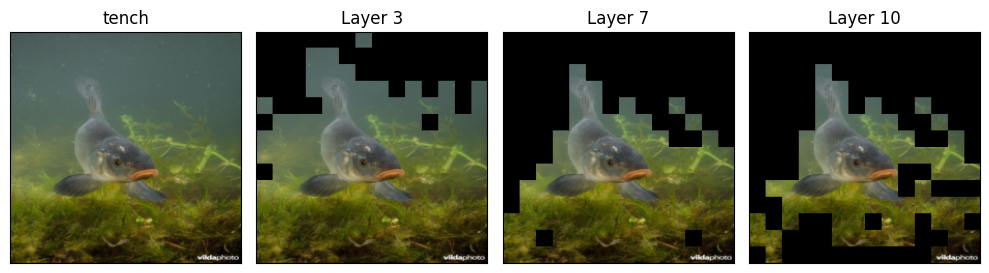

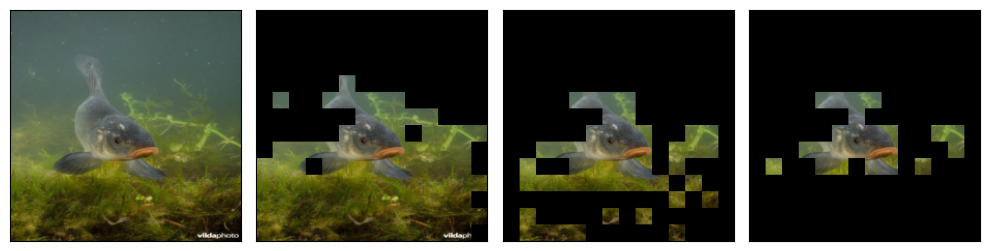

#############################


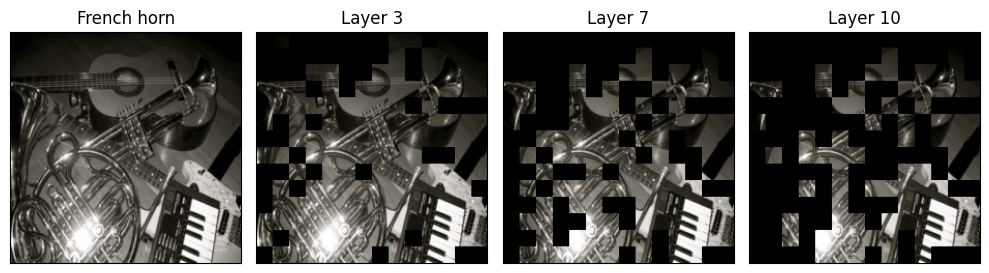

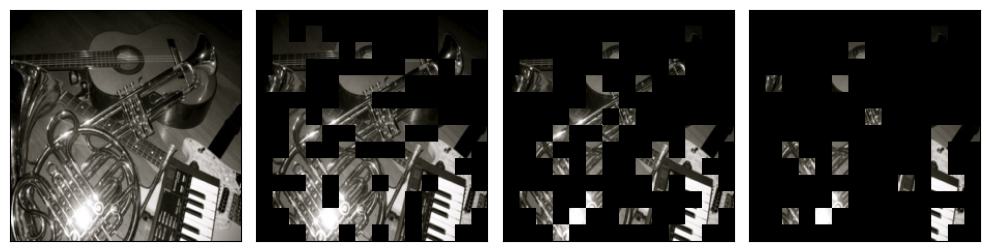

#############################


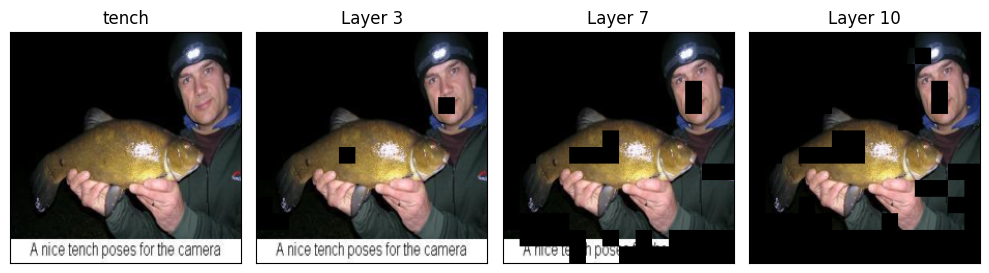

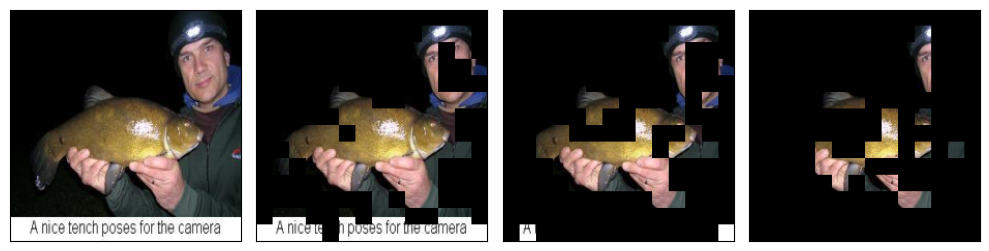

#############################


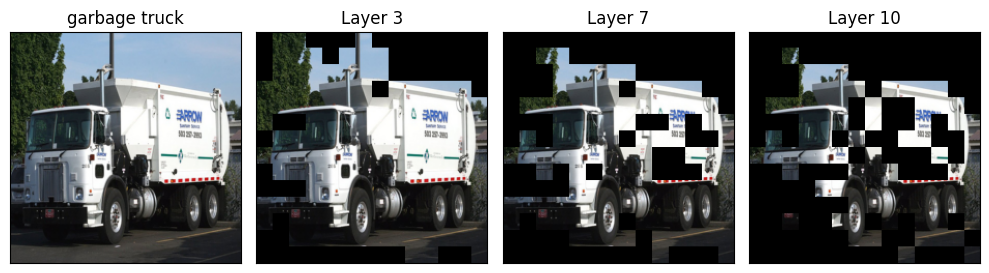

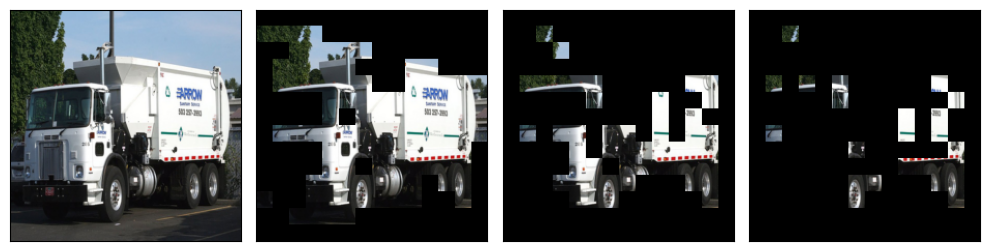

#############################


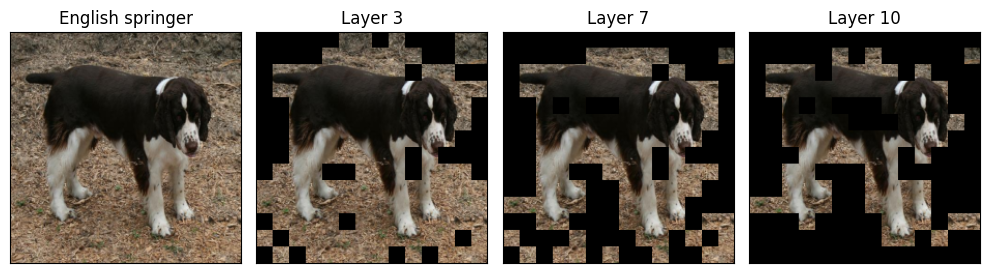

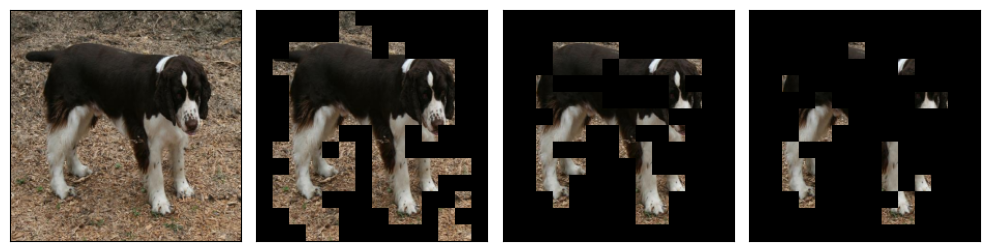

#############################


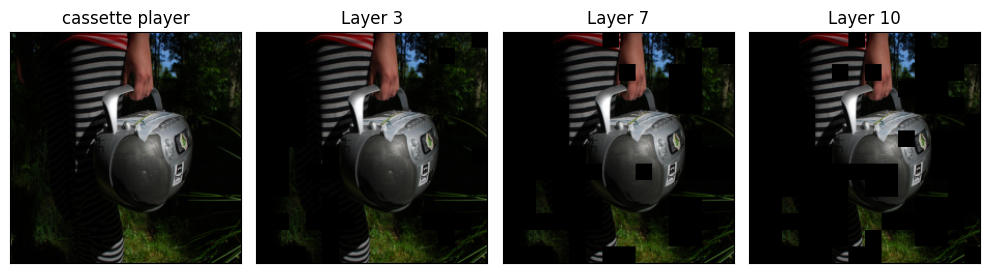

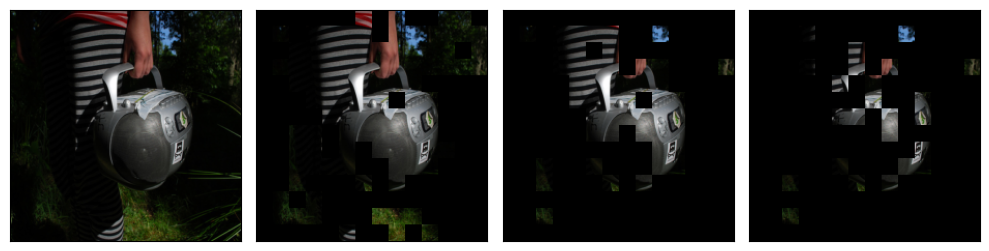

#############################


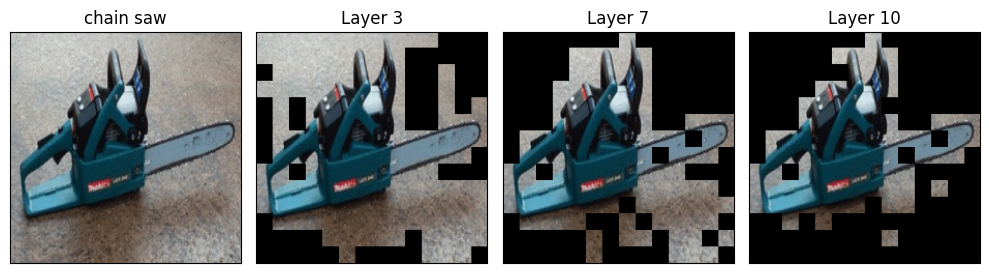

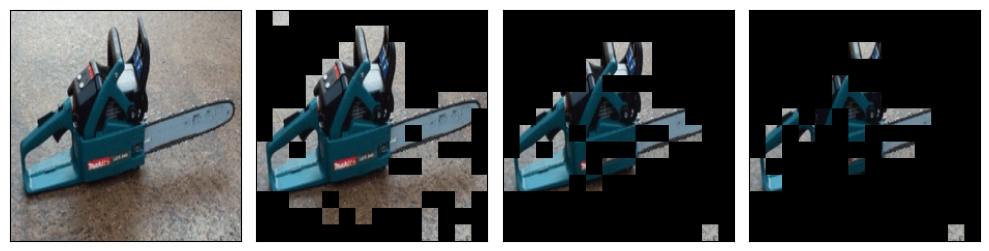

#############################


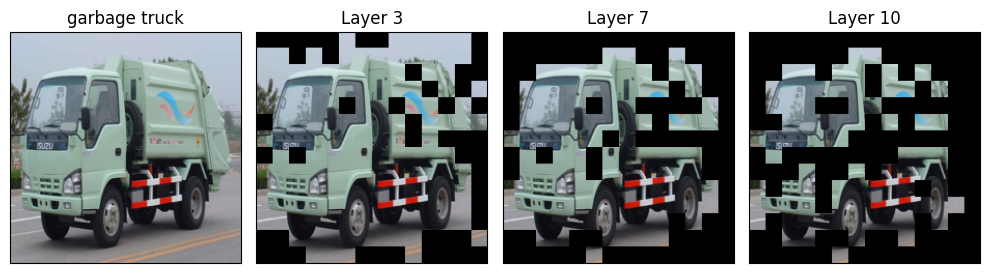

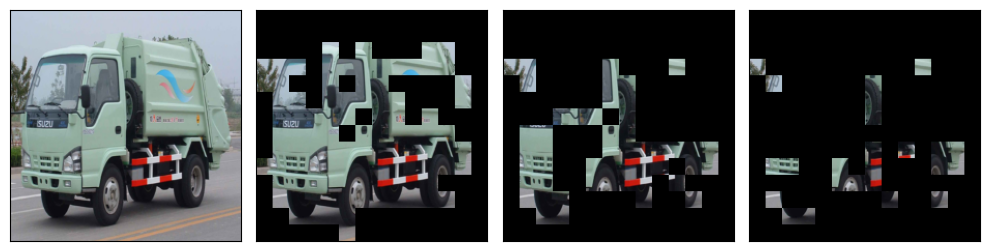

#############################


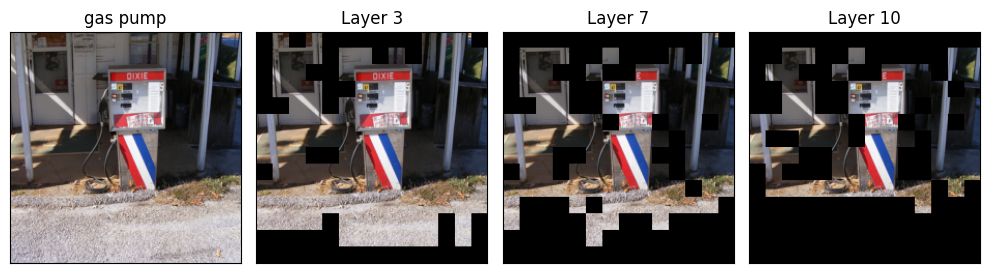

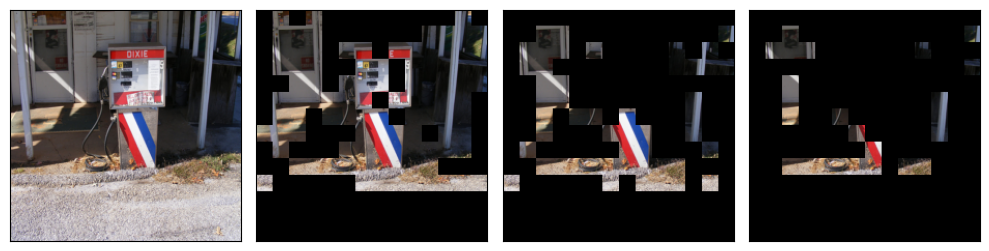

#############################


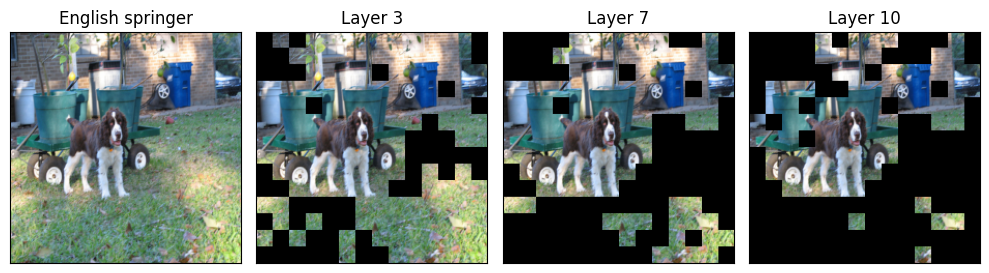

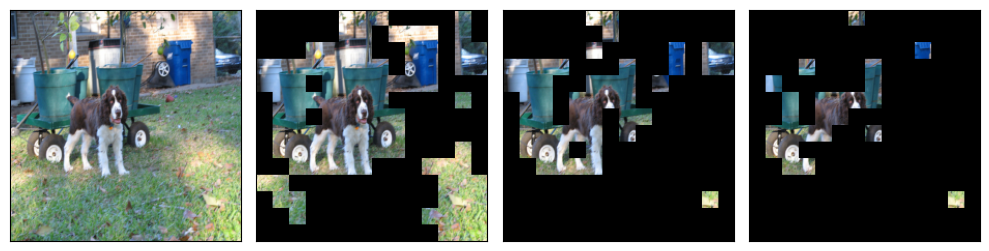

#############################


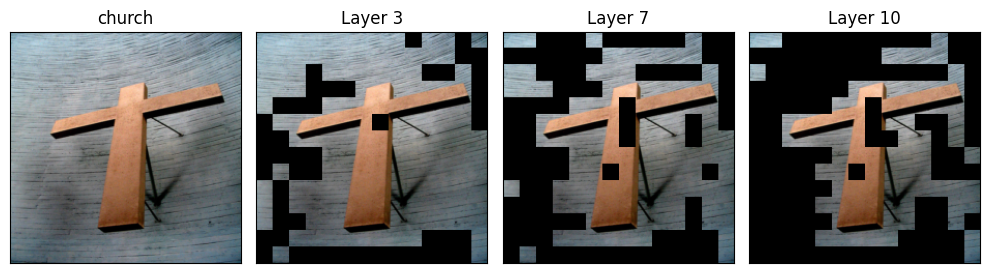

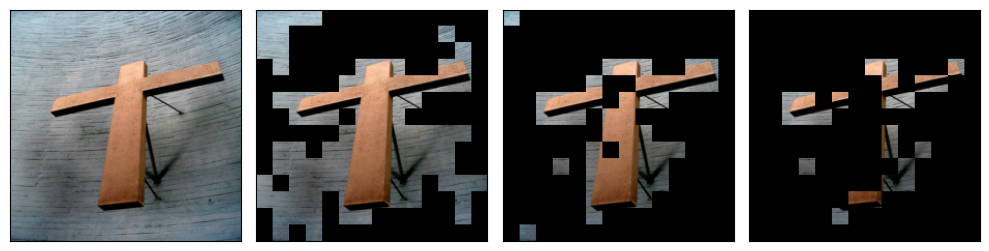

#############################


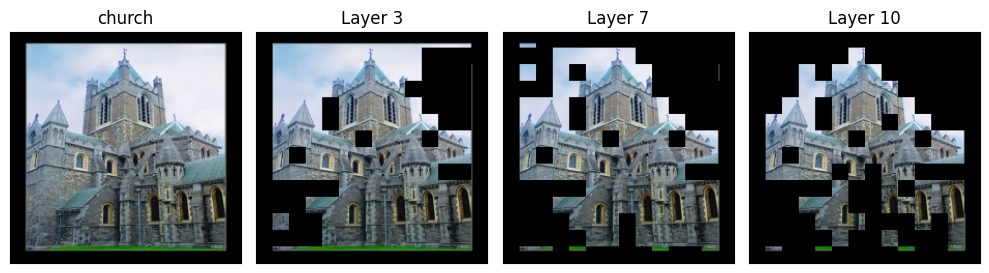

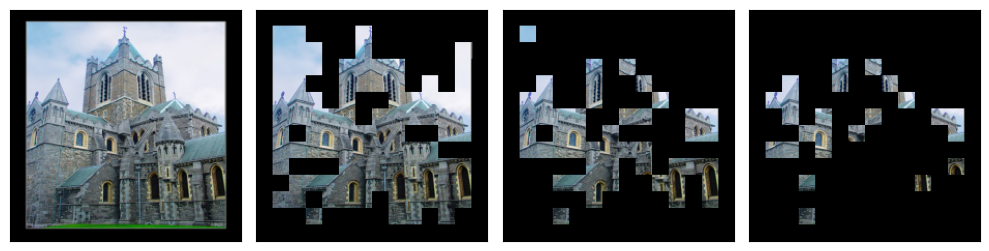

#############################


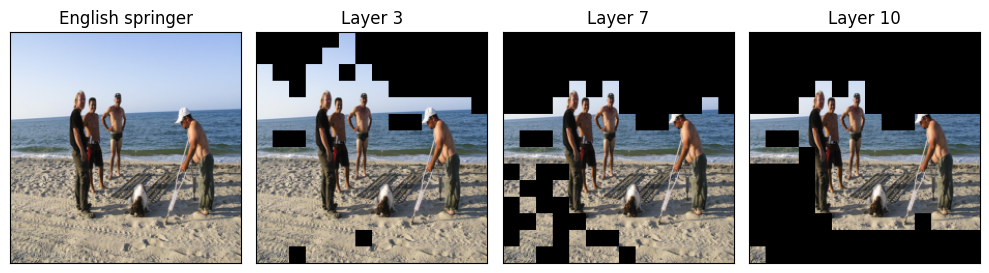

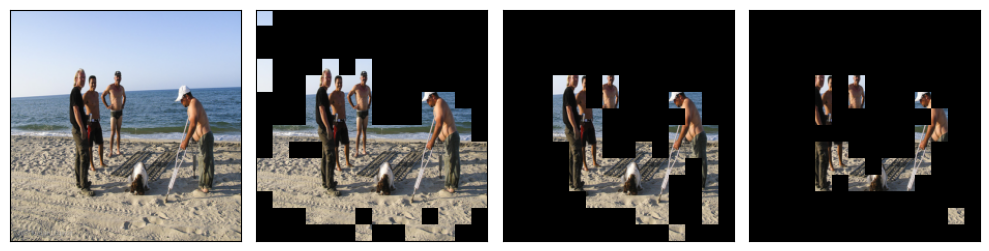

#############################


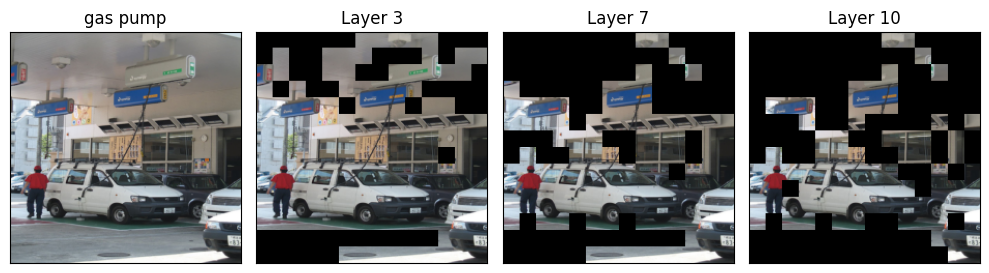

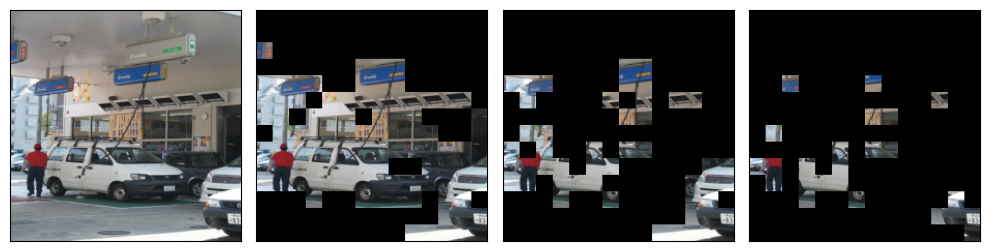

#############################


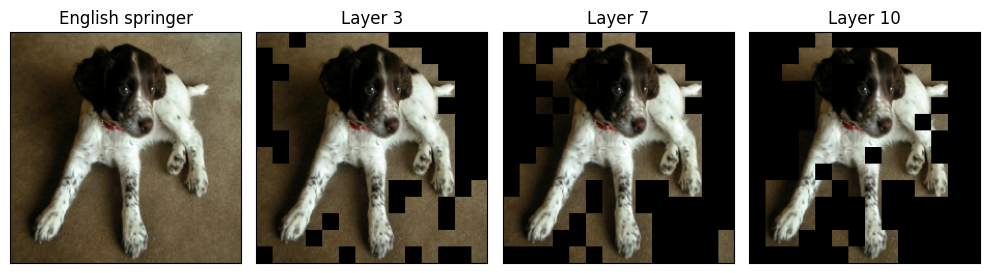

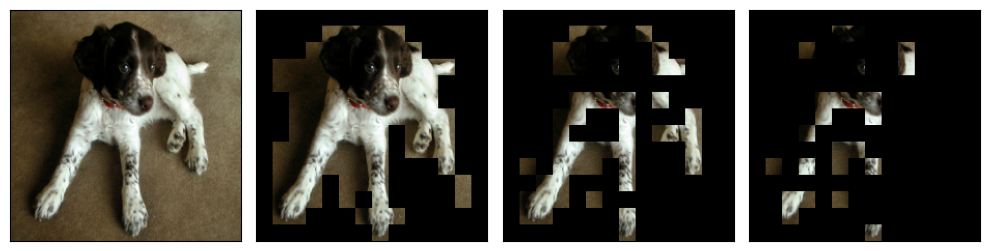

#############################


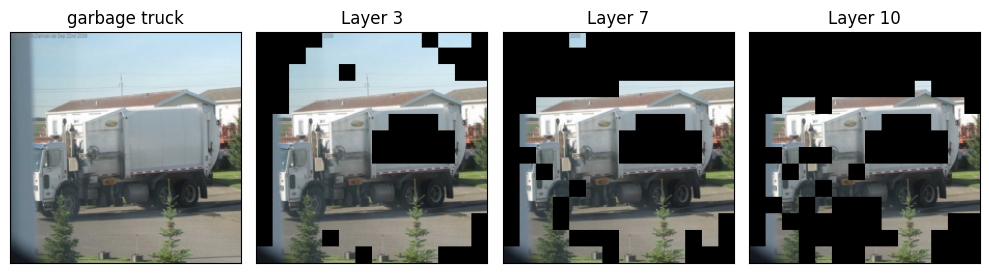

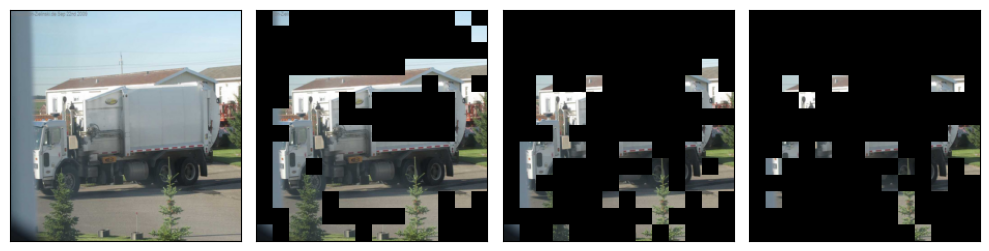

#############################


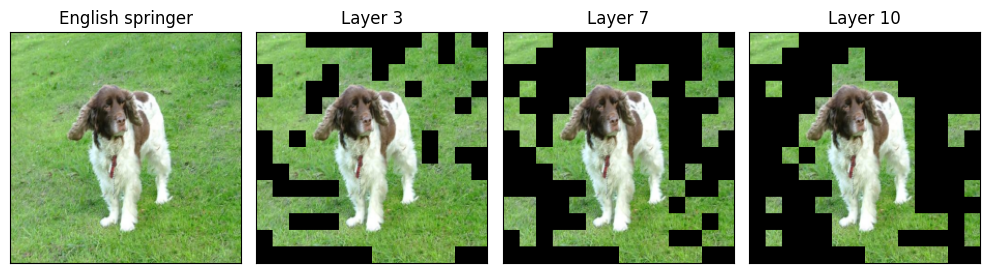

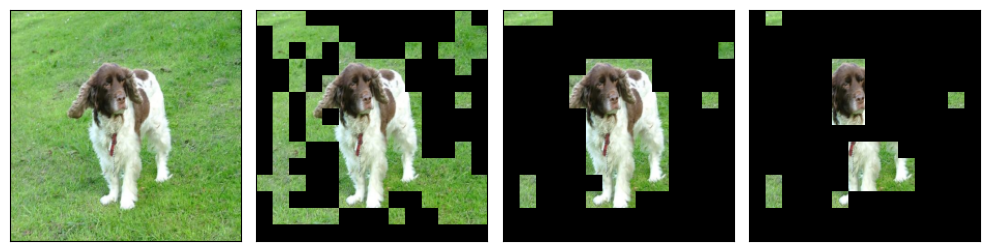

#############################


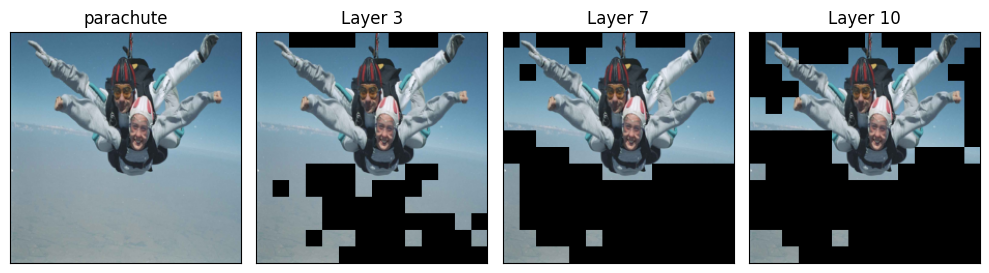

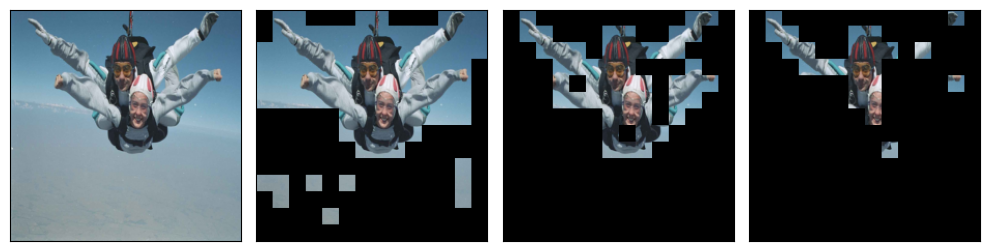

#############################


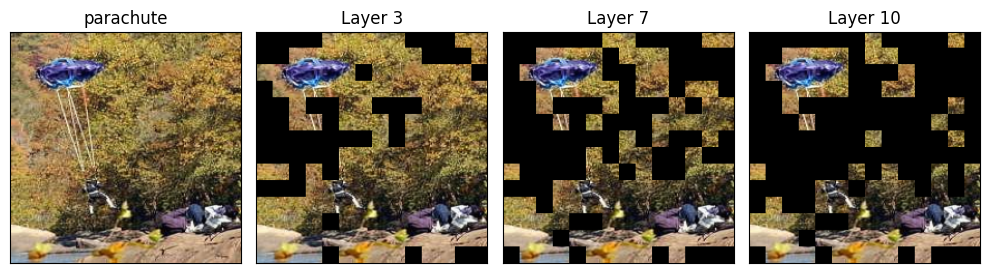

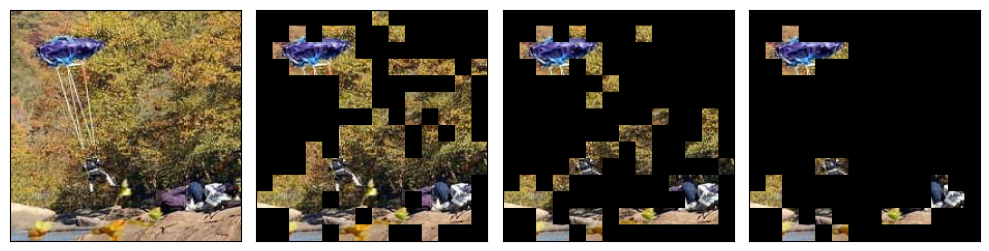

#############################


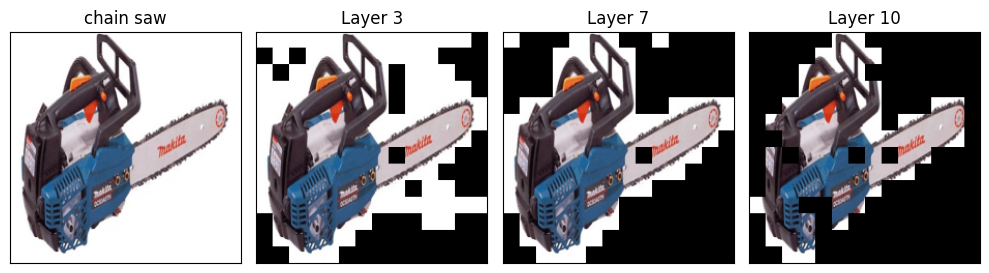

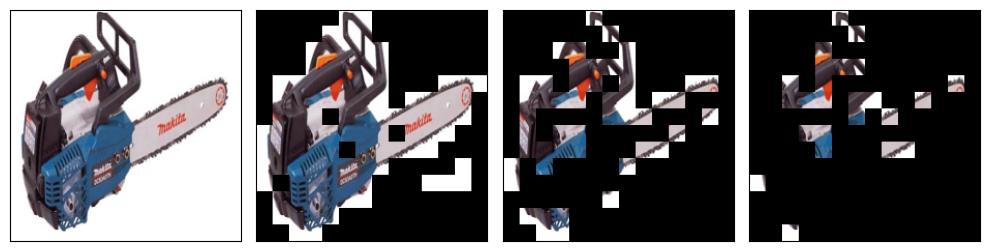

#############################


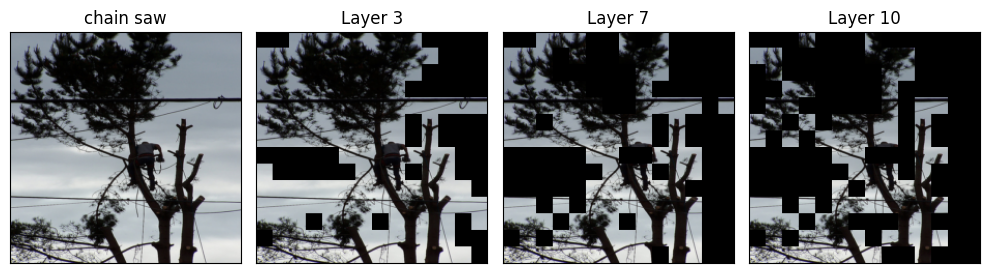

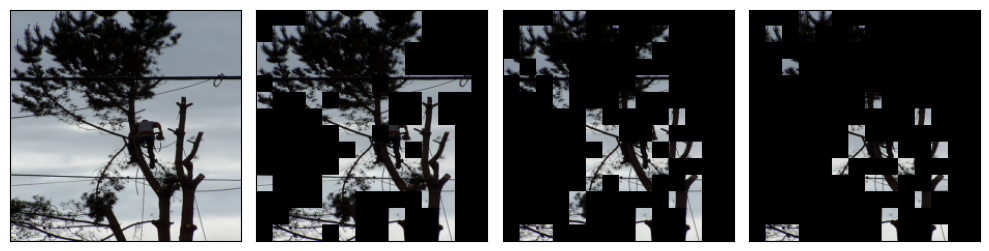

#############################


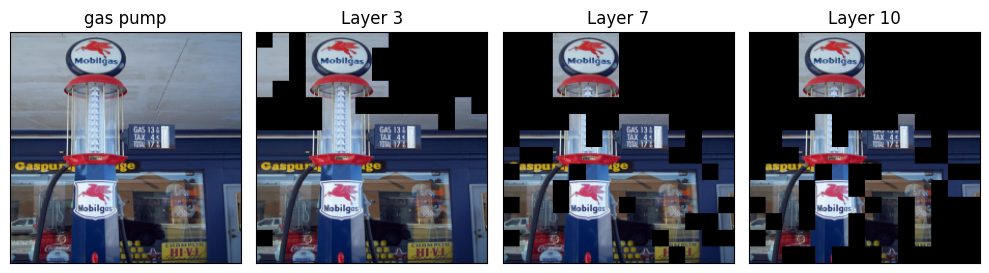

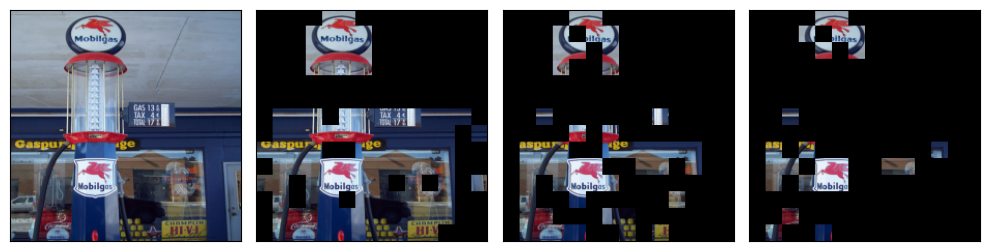

#############################


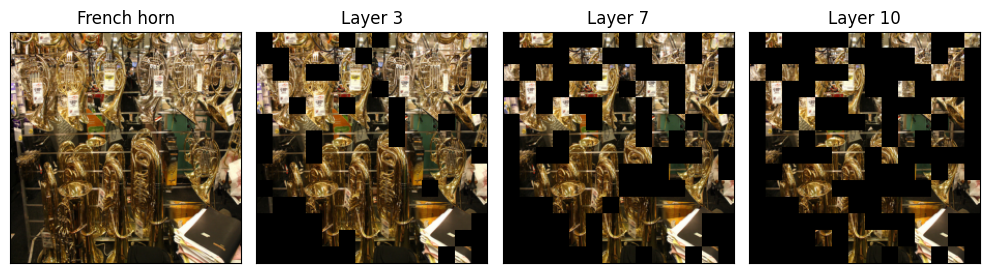

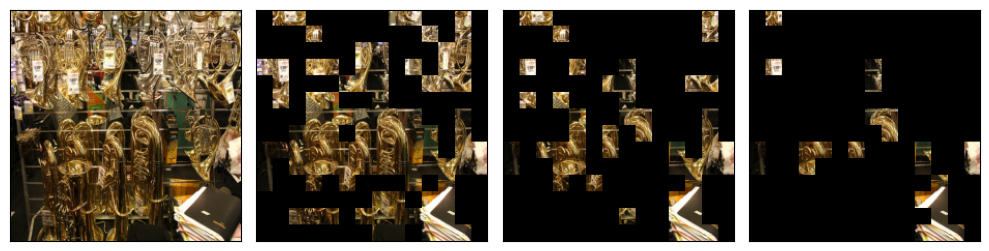

#############################


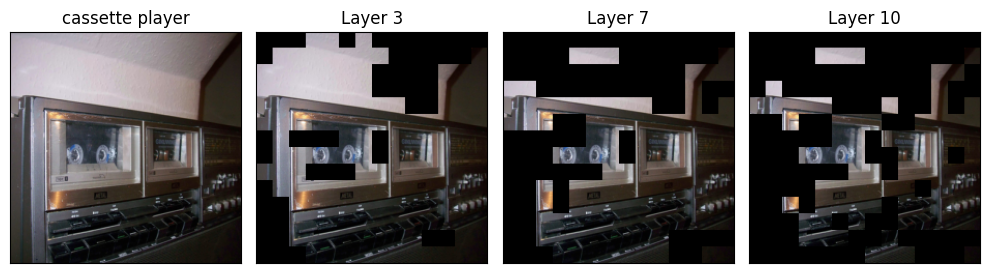

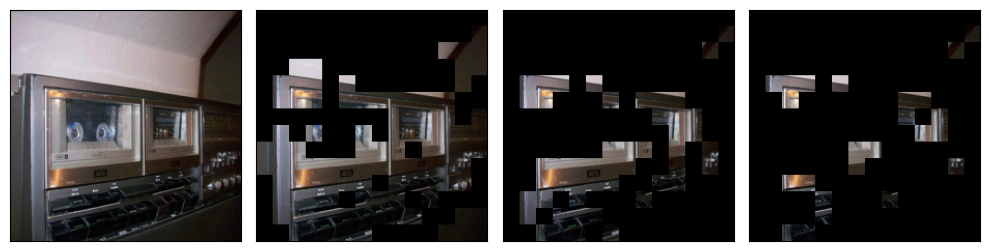

#############################


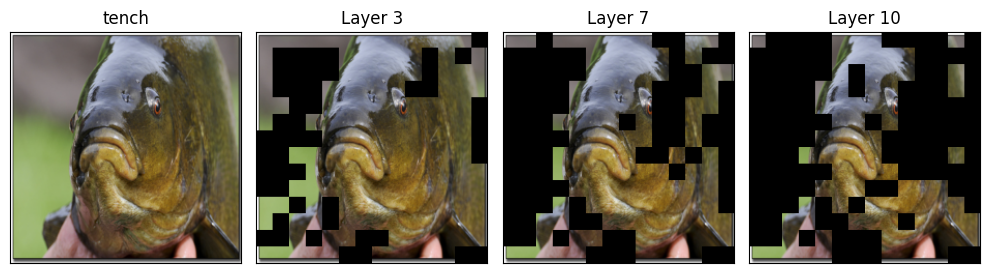

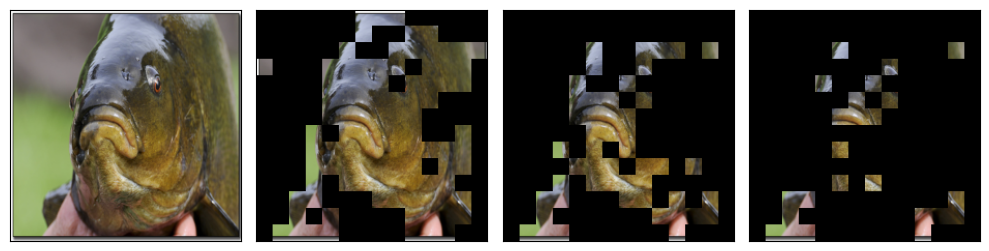

#############################


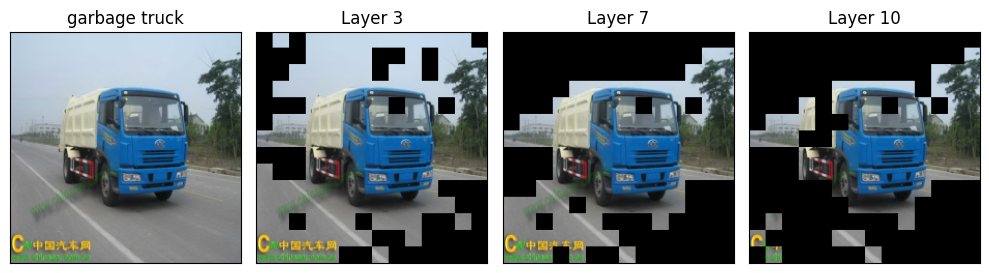

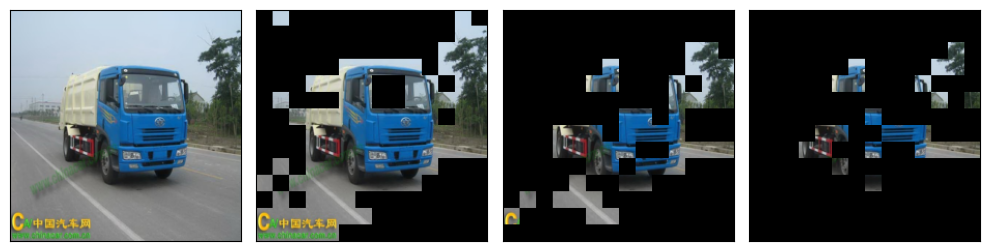

#############################


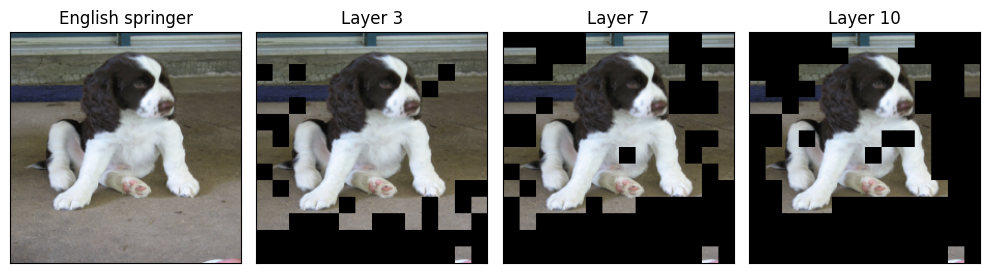

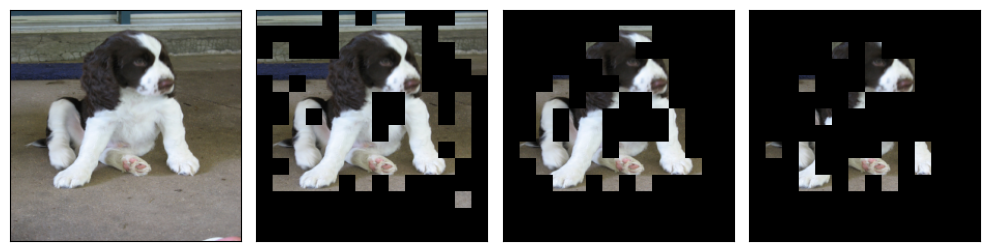

#############################


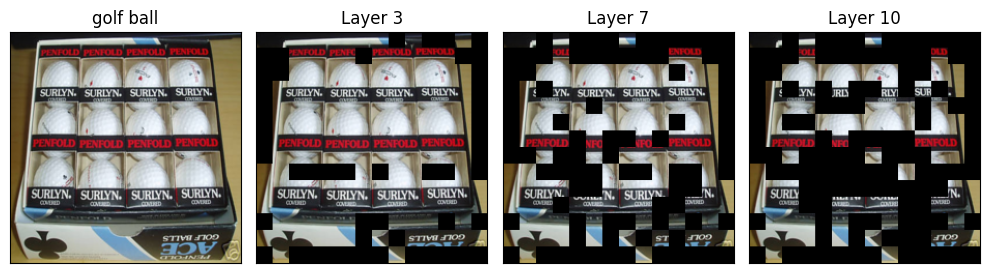

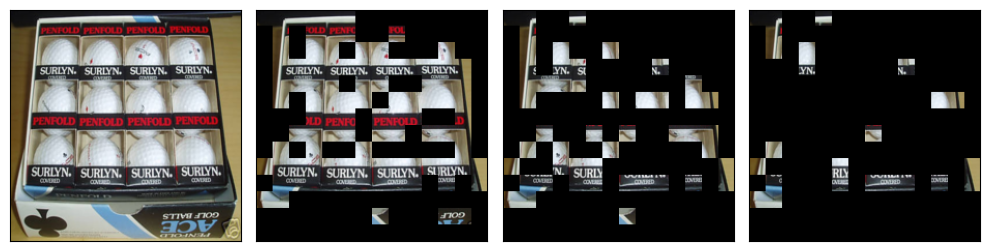

#############################


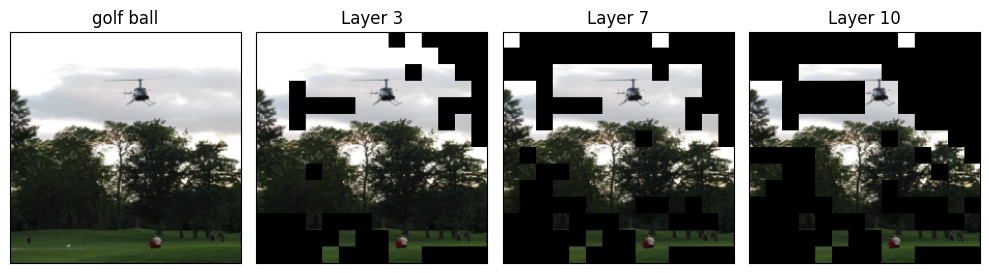

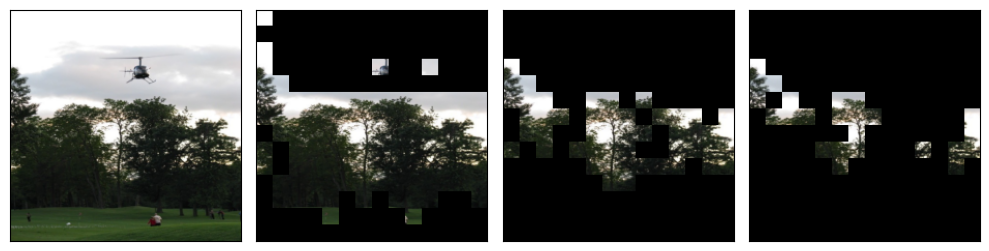

#############################


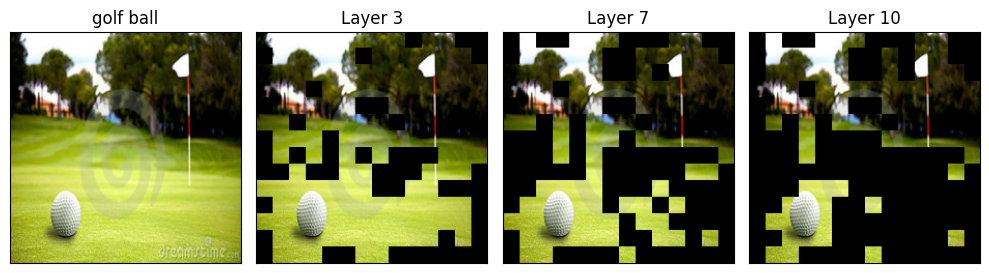

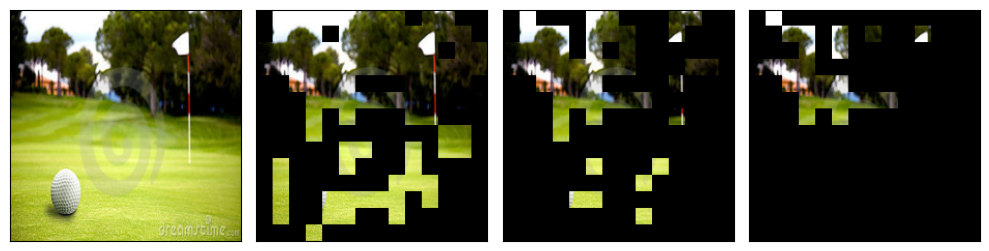

#############################


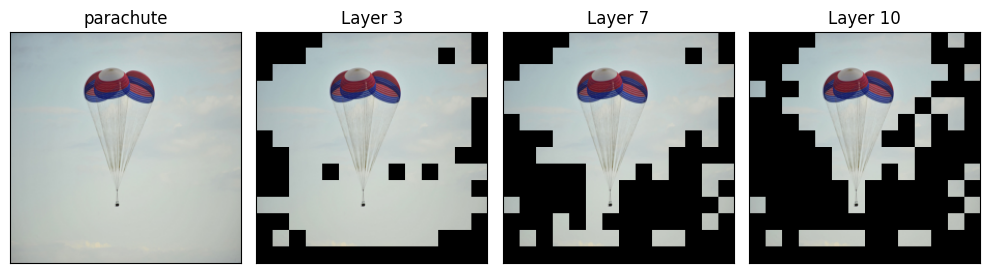

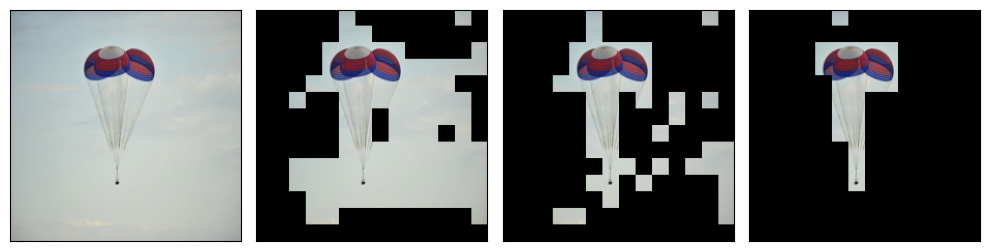

#############################


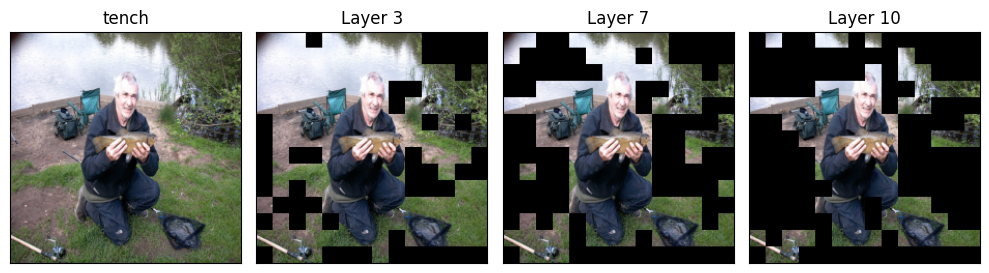

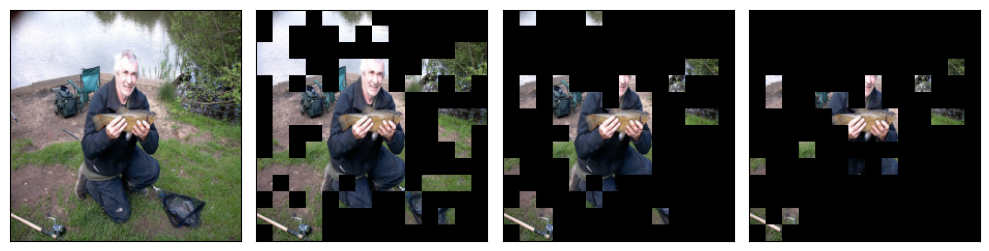

#############################


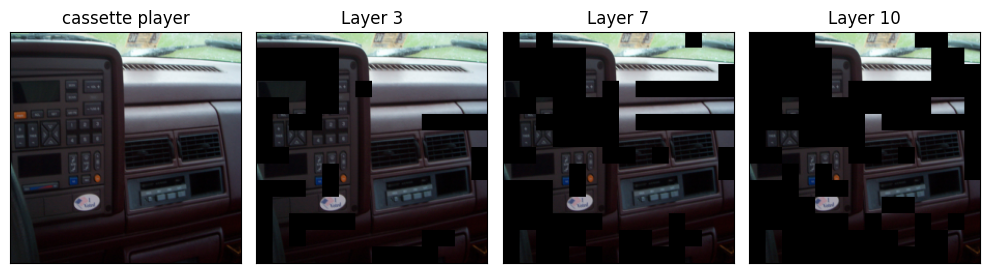

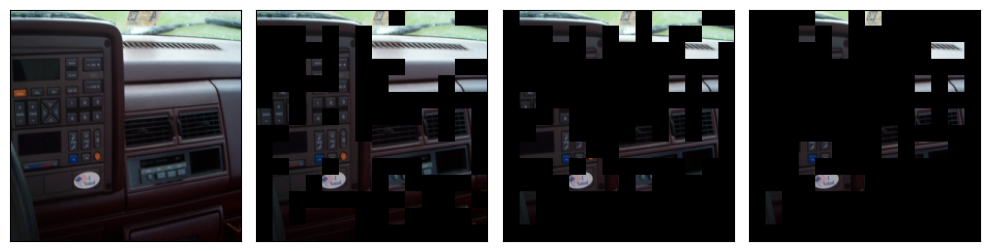

#############################


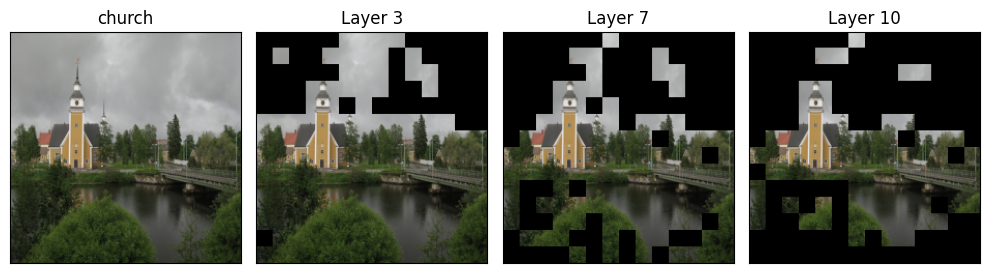

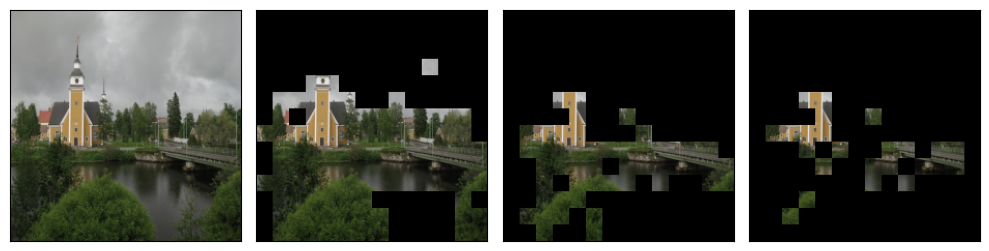

#############################


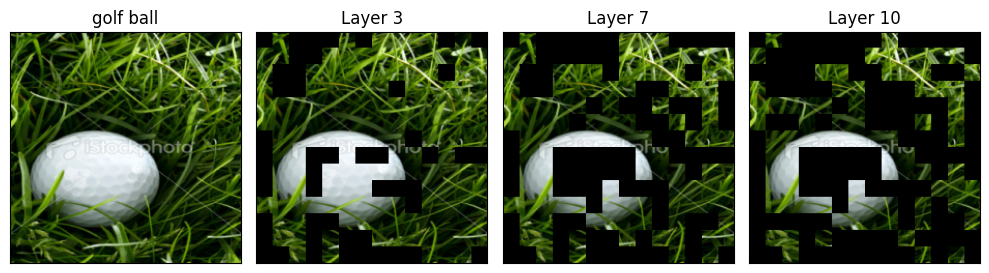

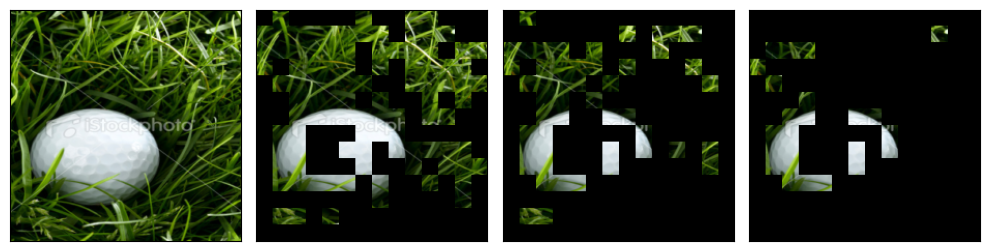

#############################


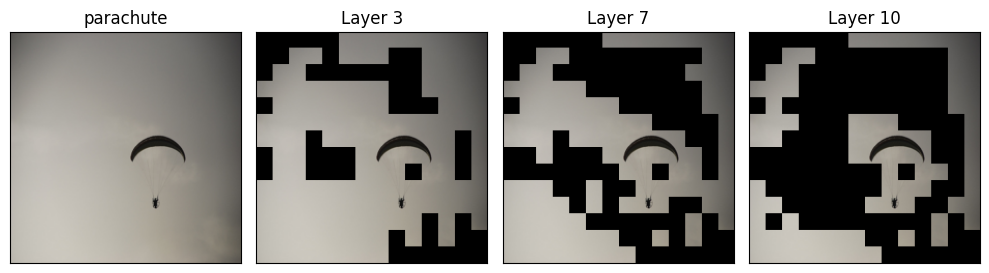

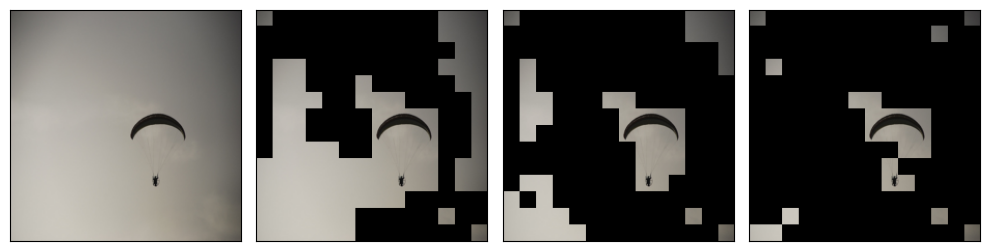

#############################


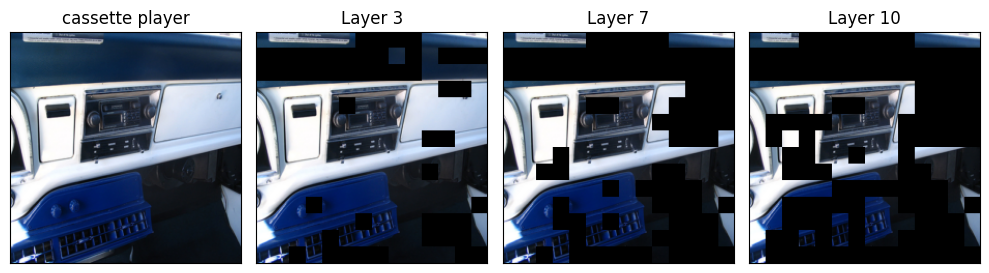

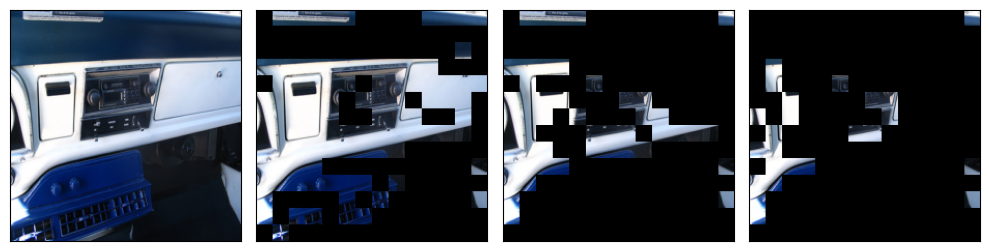

#############################


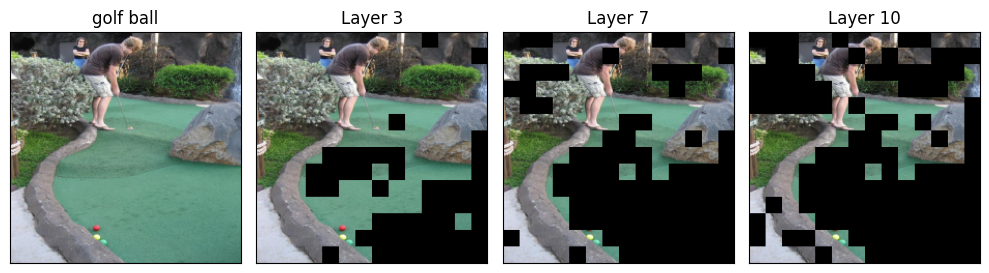

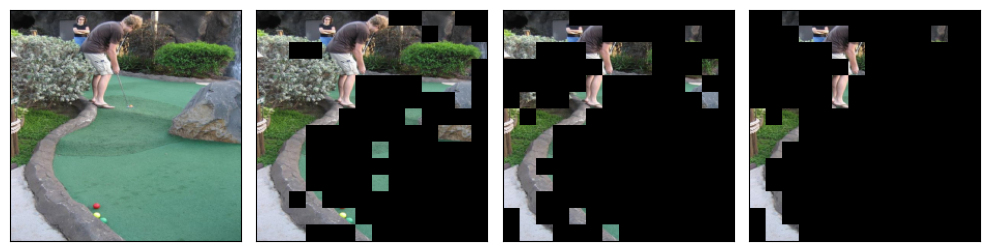

#############################


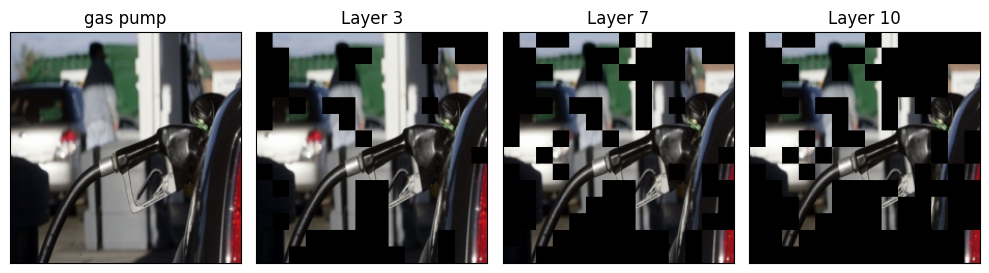

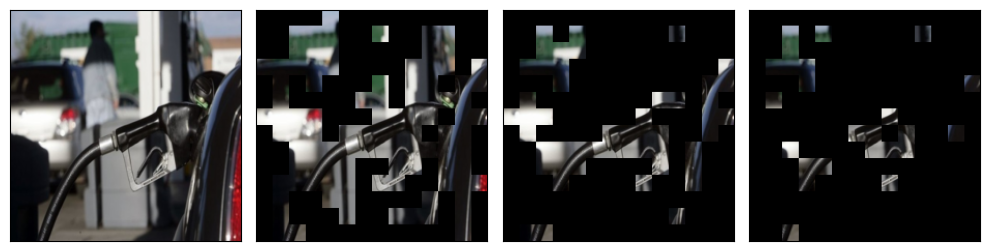

#############################


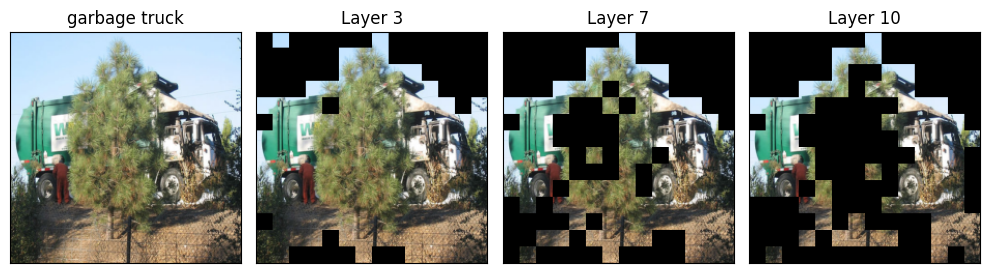

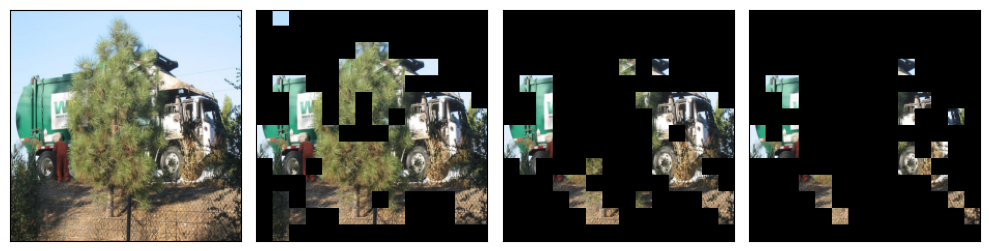

#############################


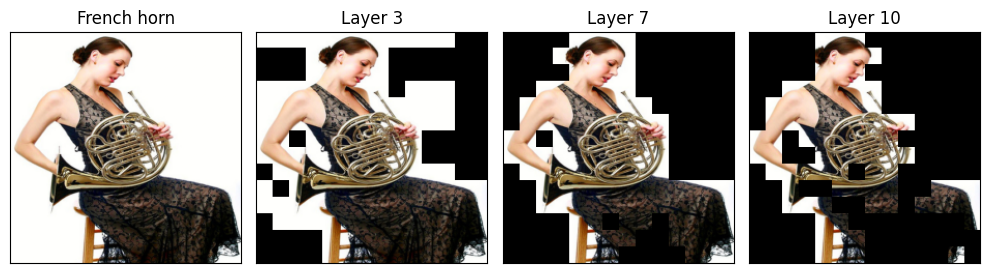

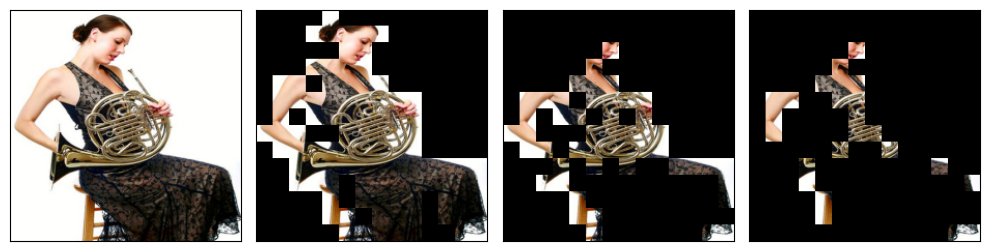

#############################


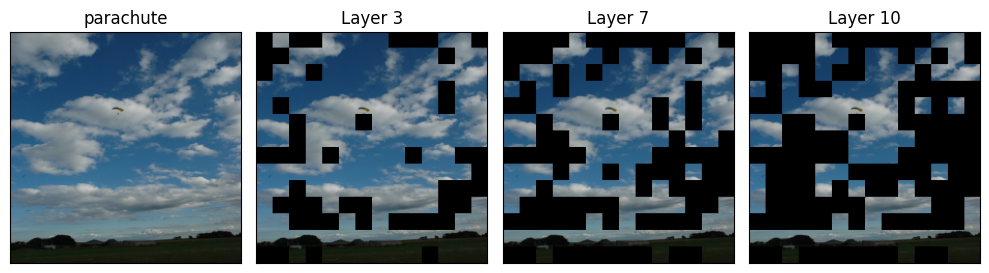

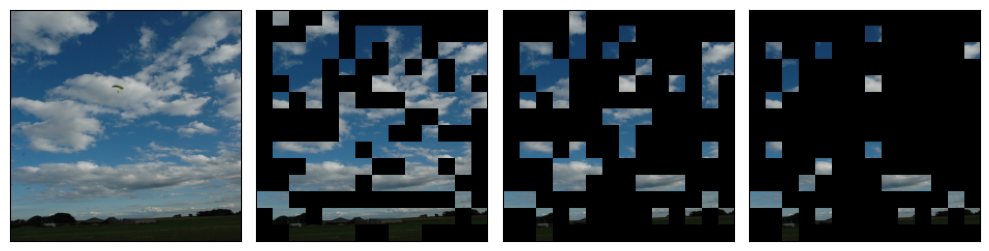

#############################


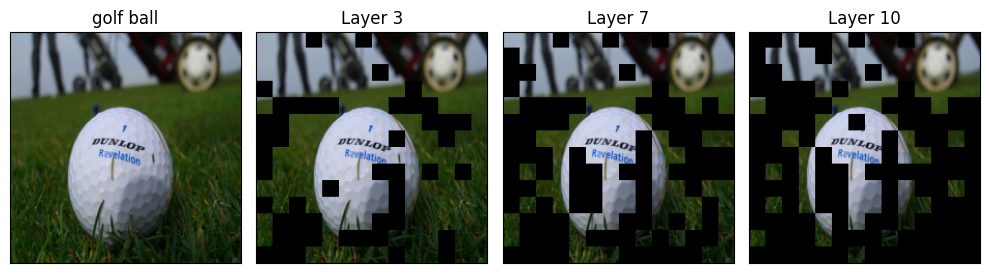

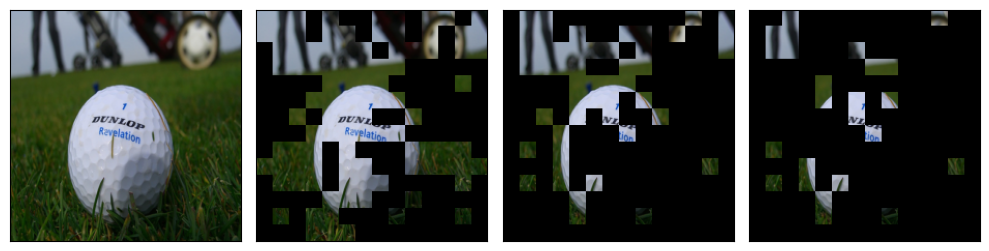

#############################


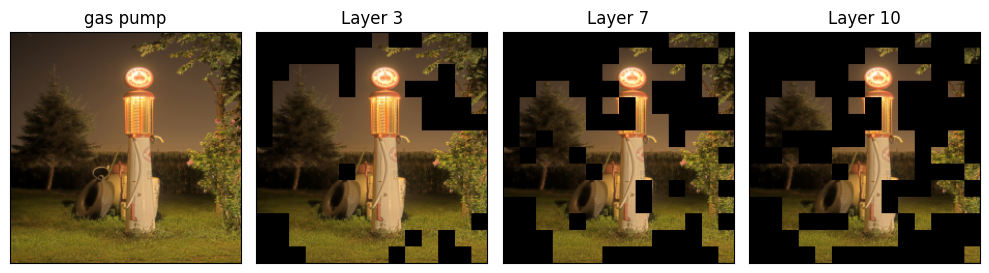

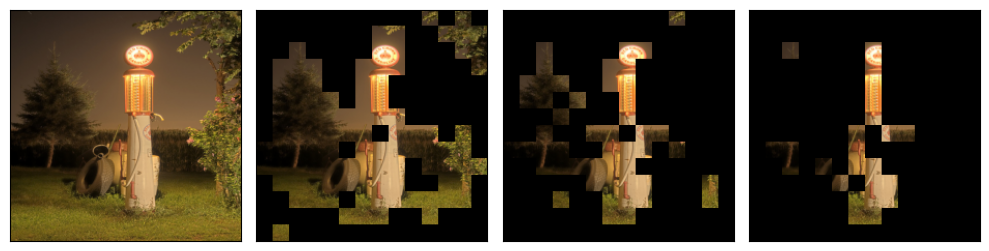

#############################


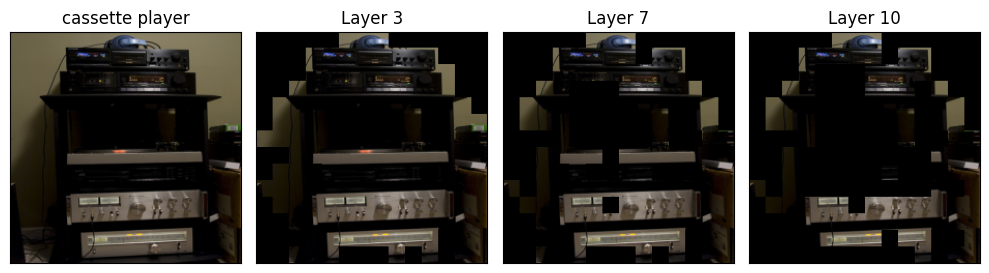

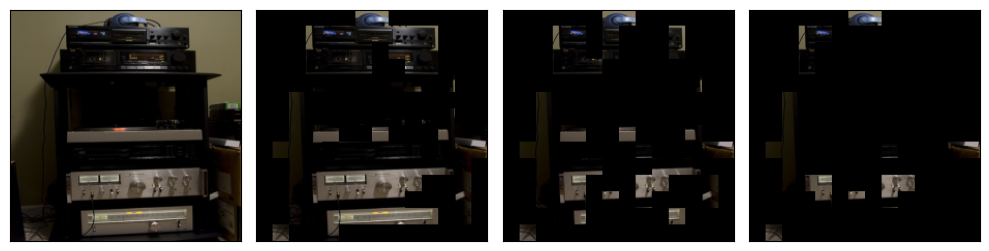

#############################


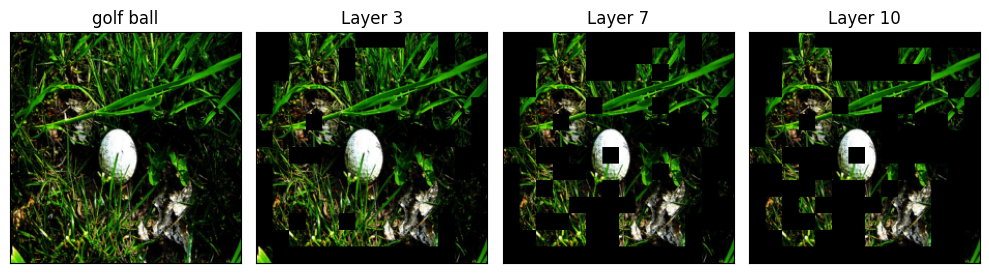

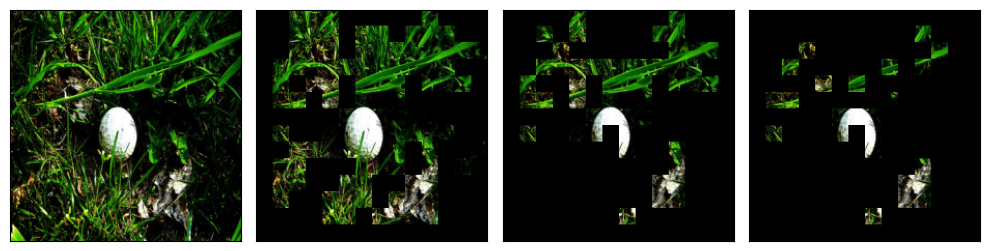

#############################


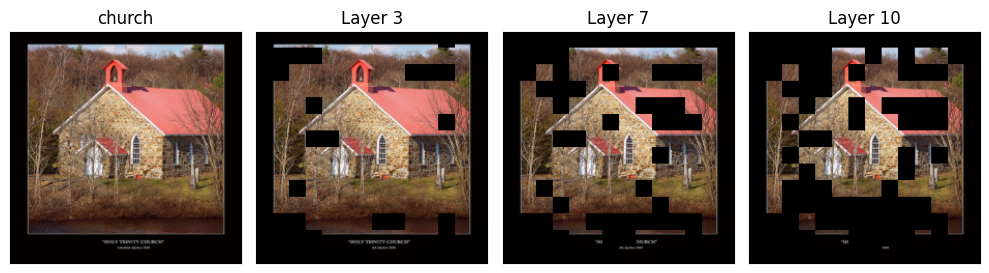

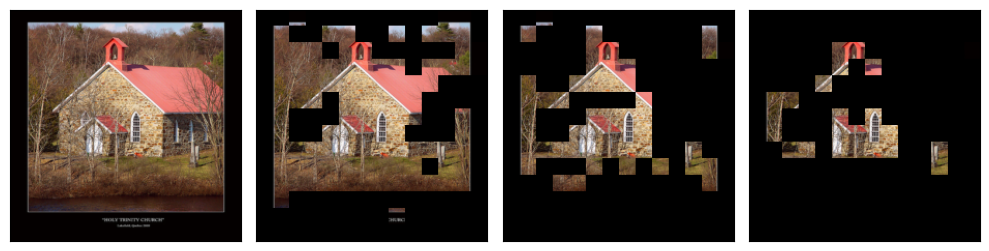

#############################


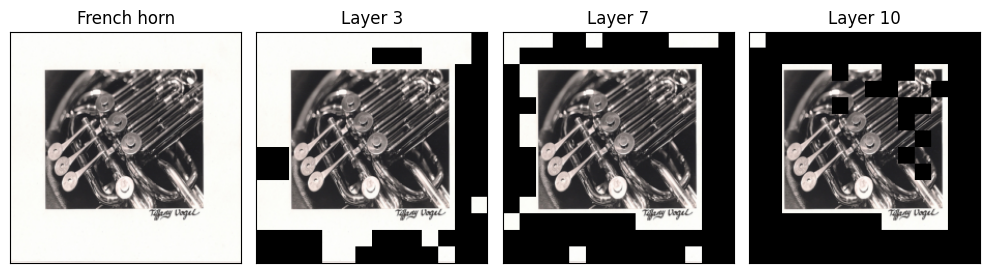

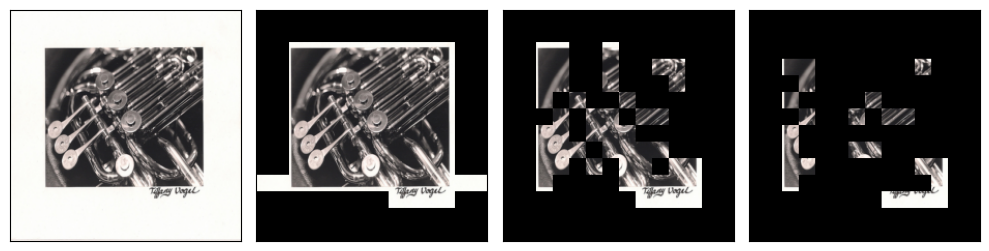

#############################


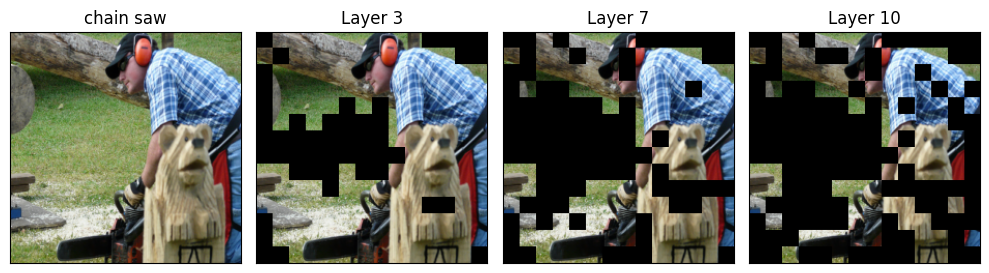

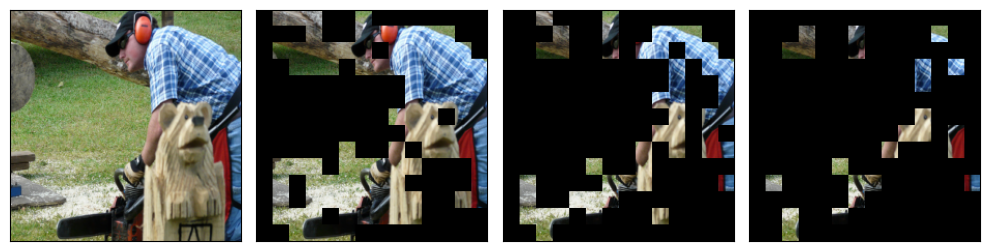

#############################


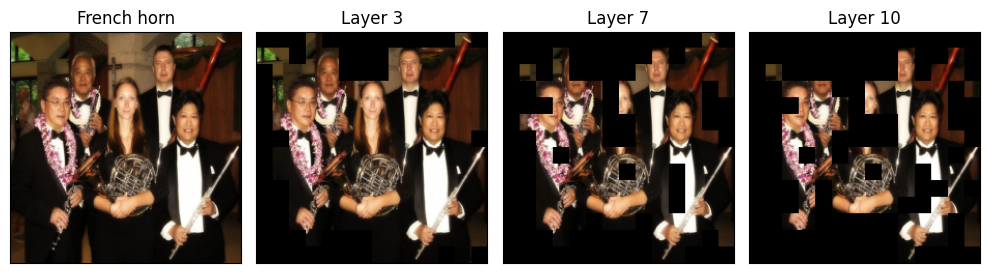

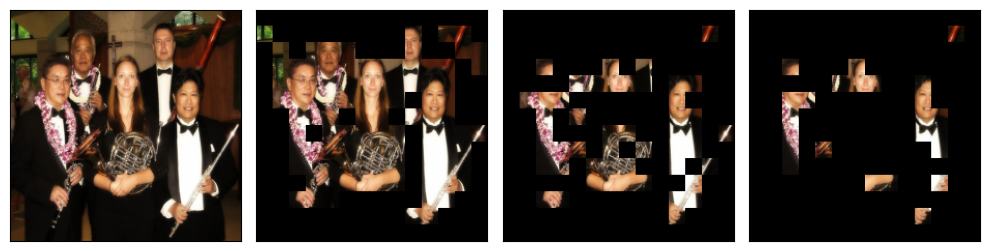

#############################


In [46]:
# n_patch = [60, 50, 40, 30, 20, 15]
# n_patch = [100, 100, 100, 75, 75, 75, 56, 56, 56, 42, 42, 42]

torch.manual_seed(42)
test_loader = torch.utils.data.DataLoader(validationset, batch_size=1, shuffle=True, num_workers=2, pin_memory=True)

mean = torch.tensor([0.5, 0.5, 0.5])
std = torch.tensor([0.5, 0.5, 0.5])


def create_mask(patch_list, mask_size, patch_size):
    mask = torch.zeros((mask_size, mask_size), dtype=torch.float32)
    for patch_index in patch_list:
        x = (patch_index // (mask_size // patch_size)) * patch_size
        y = (patch_index % (mask_size // patch_size)) * patch_size
        mask[x:x+patch_size, y:y+patch_size] = 1
    return mask.to(device)


def seleziona_indici_iterativamente(lista_originale, indici_selezione):
    risultati = []
    lista_attuale = lista_originale[:]

    for selezione in indici_selezione:
        indici_selezionati = [lista_attuale[i] for i in selezione]
        risultati.append(indici_selezionati)

        lista_attuale = indici_selezionati[:]

    return risultati



for i, (data, target) in enumerate(test_loader):

    if i == 50:
        break

    data = data.to(device)
    target = target.to(device)

    # Utilizzare il modello model_50
    results_50, tokens_50 = model_50(data, return_tokens=True)
    results_50 = functional.softmax(results_50, dim=1)
    predicted_prob_50, predicted_idx_50 = torch.max(results_50, dim=1)
    predicted_label_50 = trainset.classes[predicted_idx_50[0]]
    real_label_50 = trainset.classes[target[0]]

    # Utilizzare il modello model_75
    results_75, tokens_75 = model_75(data, return_tokens=True)
    results_75 = functional.softmax(results_75, dim=1)
    predicted_prob_75, predicted_idx_75 = torch.max(results_75, dim=1)
    predicted_label_75 = trainset.classes[predicted_idx_75[0]]
    real_label_75 = trainset.classes[target[0]]

    total = [i for i in range(196)]

    final_50 = [elem[0].tolist() for elem in tokens_50]
    final_75 = [elem[0].tolist() for elem in tokens_75]

    indici_50 = seleziona_indici_iterativamente(total, final_50)
    indici_75 = seleziona_indici_iterativamente(total, final_75)

    result_50 = []
    result_75 = []

    for indice in indici_50:
        mask = create_mask(indice, data.shape[2], patch_size)
        data_modified = data[0] * std.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device) + mean.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
        result_50.append(data_modified[0] * mask.unsqueeze(0).unsqueeze(1))

    for indice in indici_75:
        mask = create_mask(indice, data.shape[2], patch_size)
        data_modified = data[0] * std.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device) + mean.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
        result_75.append(data_modified[0] * mask.unsqueeze(0).unsqueeze(1))

    fig, axes = plt.subplots(1, 4, figsize=(10, 5))

    for j in range(0, 4):
        image_75 = result_75[j*3][0].cpu()

        axes[j].imshow(image_75.permute(1, 2, 0), cmap=plt.cm.binary)

        if j == 0:
            axes[j].set_title(f'{real_label_75[0]}')

        formatted_prob_75 = "{:.2f}%".format(predicted_prob_75.item() * 100)


        axes[j].set_xticks([])
        axes[j].set_yticks([])

        if j == 1:
            axes[j].set_title(f'Layer 3')
        if j == 2:
            axes[j].set_title(f'Layer 7')
        if j == 3:
            axes[j].set_title(f'Layer 10')

    plt.tight_layout()  
    plt.savefig(f"Imgs/{i}_75_{real_label_75[0]}.pdf", dpi=100, bbox_inches='tight')
    plt.show()

    fig, axes = plt.subplots(1, 4, figsize=(10, 5))

    for j in range(0, 4):
        image_50 = result_50[j*3][0].cpu()

        axes[j].imshow(image_50.permute(1, 2, 0), cmap=plt.cm.binary)

        formatted_prob_75 = "{:.2f}%".format(predicted_prob_75.item() * 100)
        
        axes[j].set_xticks([])
        axes[j].set_yticks([])

    plt.tight_layout()  
    plt.savefig(f"Imgs/{i}_50_{real_label_50[0]}.pdf", dpi=100, bbox_inches='tight')
    plt.show()
    
    print("#############################")

# CIFAR10

## Dataset e Modello

<h3> Parametri del dataset

In [12]:
batch_size = 64
img_size = 224
patch_size = 16
nome_file = "CIFAR10_pretrained"

## Divisione tra train e test

In [13]:
mean = (0.5, 0.5, 0.5)
std = (0.5, 0.5, 0.5)

transform_train = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

transform_validation = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


# Prepare dataset
trainset = torchvision.datasets.CIFAR10(root=dataset_path, train=True, transform=transform_train) #download=True,
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

validationset = torchvision.datasets.CIFAR10(root=dataset_path, train=False, transform=transform_validation) #download=True

validation_loader = torch.utils.data.DataLoader(validationset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

classes = trainset.classes
print(classes)

['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']


## Inizializzazione

In [14]:
def create_patch_list(total_patches, cut):
    # Calcola l'importo scontato per ogni blocco di 3 elementi
    discounted_patches = total_patches
    patch_list = []
    for i in range(12):
        if i % 3 == 0 and i != 0:
            discounted_patches = int(discounted_patches * (cut / 100))
        patch_list.append(discounted_patches)
    return patch_list



def performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size):

    set_seed(42)

    patch = create_patch_list(total_patches, cut)

    if modello == 'PatchMergerViT':
        patch = [(2,patch[3]),(5,patch[6]),(8,patch[9])]

    model = get_weights(modello, patch, num_classes, model_timm, dim, heads)
    print(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv')

    # Sposta il modello sulla GPU (se disponibile)
    model.to(device)

    # definiamo l'ottimizzatore
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_loss, validation_loss, validation_acc, epoch_time = train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

    df = pd.DataFrame({'train_loss': train_loss,
                       'validation_loss': validation_loss,
                       'validation_acc': [tensor.item() for tensor in validation_acc],
                       'epoch_time': epoch_time
                       })

    return df.to_csv(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv', index=False)

In [15]:
epoche = 5
learning_rate = 0.0001
num_classes = 10
cut_list = [
            # 75,
            50,
            # 25
           ]
total_patches = int(img_size/patch_size)**2

## Base

In [17]:
# Definizione dei parametri del modello ViT
model_name = 'vit_base_patch16_224.augreg2_in21k_ft_in1k'
pretrained = True
dim = 768
heads = 12

size = 'Base'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

../../Results/CIFAR10_pretrained/MultiViT_Base_50%.csv
Epoch: 1/5
INIZIO TRAINING
[    0/50000 (  0%)]  Loss: 2.6393
[ 6400/50000 ( 13%)]  Loss: 0.9537
[12800/50000 ( 26%)]  Loss: 0.3521
[19200/50000 ( 38%)]  Loss: 0.2642
[25600/50000 ( 51%)]  Loss: 0.2765
[32000/50000 ( 64%)]  Loss: 0.3715
[38400/50000 ( 77%)]  Loss: 0.1871
[44800/50000 ( 90%)]  Loss: 0.2075
INIZIO VALIDATION

Average test loss: 0.2045  Accuracy: 9303/10000 (93.03%)

Saving Best Accuracy Model
End of Saving 

Execution time: 832.03 seconds
########################################
Epoch: 2/5
INIZIO TRAINING
[    0/50000 (  0%)]  Loss: 0.1460
[ 6400/50000 ( 13%)]  Loss: 0.2142
[12800/50000 ( 26%)]  Loss: 0.1159
[19200/50000 ( 38%)]  Loss: 0.2418
[25600/50000 ( 51%)]  Loss: 0.1374
[32000/50000 ( 64%)]  Loss: 0.0973
[38400/50000 ( 77%)]  Loss: 0.1322
[44800/50000 ( 90%)]  Loss: 0.2659
INIZIO VALIDATION

Average test loss: 0.2136  Accuracy: 9264/10000 (92.64%)

Execution time: 835.18 seconds
###############################

## Small

In [ ]:
# Definizione dei parametri del modello ViT
model_name = 'vit_small_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 384
heads = 6

cut_list = [
            75,
            50,
            # 25
           ]
size = 'Small'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Tiny

In [ ]:
# # Definizione dei parametri del modello ViT
# model_name = 'vit_tiny_patch16_224.augreg_in21k_ft_in1k'
# pretrained = True
# dim = 192
# heads = 3

# size = 'Tiny'

# # Caricamento del modello ViT utilizzando timm
# model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
# for cut in cut_list:

#     modello = 'MultiViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'PatchMergerViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'ATSViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'TopKViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


# modello = 'ViT'
# performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Visualizzazione

In [ ]:
# # Definizione dei parametri del modello ViT
# model_name = 'vit_tiny_patch16_224.augreg_in21k_ft_in1k'
# pretrained = True
# dim = 192
# heads = 3

# size = 'Tiny'
# cut = 25
# patch = create_patch_list(total_patches, cut)

# # Caricamento del modello ViT utilizzando timm
# model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

# modello = 'MultiViT'

# model = get_weights(modello, patch, num_classes, model_timm, dim, heads)

# # Sposta il modello sulla GPU (se disponibile)
# model.to(device)

# # definiamo l'ottimizzatore
# optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# train_loss, validation_loss, validation_acc, epoch_time = train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

In [ ]:
# # n_patch = [60, 50, 40, 30, 20, 15]
# # n_patch = [100, 100, 100, 75, 75, 75, 56, 56, 56, 42, 42, 42]

# test_loader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# mean = torch.tensor([0.5, 0.5, 0.5])
# std = torch.tensor([0.5, 0.5, 0.5])


# def create_mask(patch_list, mask_size, patch_size):
#     mask = torch.zeros((mask_size, mask_size), dtype=torch.float32)
#     for patch_index in patch_list:
#         x = (patch_index // (mask_size // patch_size)) * patch_size
#         y = (patch_index % (mask_size // patch_size)) * patch_size
#         mask[x:x+patch_size, y:y+patch_size] = 1
#     return mask.to(device)


# def seleziona_indici_iterativamente(lista_originale, indici_selezione):
#     risultati = []
#     lista_attuale = lista_originale[:]

#     for selezione in indici_selezione:
#         indici_selezionati = [lista_attuale[i] for i in selezione]
#         risultati.append(indici_selezionati)

#         lista_attuale = indici_selezionati[:]

#     return risultati



# for i, (data, target) in enumerate(test_loader):

#     data = data.to(device)

#     target = target.to(device)

#     results, tokens = model(data, return_tokens = True)

#     results = functional.softmax(results, dim=1)
#     predicted_prob, predicted_idx = torch.max(results, dim=1)
#     predicted_label = trainset.classes[predicted_idx[0]]
#     real_label = trainset.classes[target[0]]

#     total = [i for i in range(196)]

#     final = [elem[0].tolist() for elem in tokens]

#     indici = seleziona_indici_iterativamente(total, final)

#     result = []
#     for indice in indici:
#         mask = create_mask(indice, data.shape[2], patch_size)
#         data_modified = data[0] * std.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device) + mean.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
#         result.append(data_modified[0] * mask.unsqueeze(0).unsqueeze(1))

#     fig, axes = plt.subplots(1, 4, figsize=(20, 8))

#     for j in range(0, 4):
#         image = result[j*3][0].cpu()
#         axes[j].imshow(image.permute(1, 2, 0), cmap=plt.cm.binary)
#         if j == 0: axes[j].set_title(f'Real: {real_label[0]}')
#         probability_percentage = predicted_prob.item() * 100
#         formatted_prob = "{:.2f}%".format(probability_percentage)
#         if j == 3: axes[j].set_title(f'Predicted: {predicted_label[0]} \n Prob: {formatted_prob}')

#     plt.tight_layout()  # Assicura che le immagini siano ben posizionate
#     plt.show()


#     print("#############################")
#     time.sleep(2)


# FMNIST

## Dataset e Modello

<h3> Parametri del dataset

In [12]:
batch_size = 64
img_size = 224
patch_size = 16
nome_file = "FMNIST_pretrained"

## Divisione tra train e test

In [13]:
mean = (0.5, 0.5, 0.5)
std = (0.5, 0.5, 0.5)

trans = transforms.Lambda(lambda x: x.repeat(3, 1, 1) if x.size(0)==1 else x)

transform_train = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    trans,
    transforms.Normalize(mean, std),
])


transform_validation = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    trans,
    transforms.Normalize(mean, std),
])


# Prepare dataset
trainset = torchvision.datasets.FashionMNIST(root=dataset_path, train=True, transform=transform_train) #download=True,
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)

validationset = torchvision.datasets.FashionMNIST(root=dataset_path, train=False, transform=transform_validation) #download=True

validation_loader = torch.utils.data.DataLoader(validationset, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

classes = trainset.classes
print(classes)

['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


## Inizializzazione

In [14]:
def create_patch_list(total_patches, cut):
    # Calcola l'importo scontato per ogni blocco di 3 elementi
    discounted_patches = total_patches
    patch_list = []
    for i in range(12):
        if i % 3 == 0 and i != 0:
            discounted_patches = int(discounted_patches * (cut / 100))
        patch_list.append(discounted_patches)
    return patch_list



def performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size):

    set_seed(42)

    patch = create_patch_list(total_patches, cut)

    if modello == 'PatchMergerViT':
        patch = [(2,patch[3]),(5,patch[6]),(8,patch[9])]

    model = get_weights(modello, patch, num_classes, model_timm, dim, heads)
    print(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv')

    # Sposta il modello sulla GPU (se disponibile)
    model.to(device)

    # definiamo l'ottimizzatore
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    train_loss, validation_loss, validation_acc, epoch_time = train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

    df = pd.DataFrame({'train_loss': train_loss,
                       'validation_loss': validation_loss,
                       'validation_acc': [tensor.item() for tensor in validation_acc],
                       'epoch_time': epoch_time
                       })

    return df.to_csv(f'{results_save_path}{nome_file}/{modello}_{size}_{cut}%.csv', index=False)

In [15]:
epoche = 5
learning_rate = 0.0001
num_classes = 10
cut_list = [
            # 75,
            50,
            # 25
           ]
total_patches = int(img_size/patch_size)**2

## Base

In [16]:
# Definizione dei parametri del modello ViT
model_name = 'vit_base_patch16_224.augreg2_in21k_ft_in1k'
pretrained = True
dim = 768
heads = 12

size = 'Base'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    modello = 'MultiViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

../../Results/FMNIST_pretrained/MultiViT_Base_50%.csv
Epoch: 1/5
INIZIO TRAINING
[    0/60000 (  0%)]  Loss: 2.6324
[ 6400/60000 ( 11%)]  Loss: 0.4541
[12800/60000 ( 21%)]  Loss: 0.3694
[19200/60000 ( 32%)]  Loss: 0.3214
[25600/60000 ( 43%)]  Loss: 0.2816
[32000/60000 ( 53%)]  Loss: 0.2578
[38400/60000 ( 64%)]  Loss: 0.2606
[44800/60000 ( 75%)]  Loss: 0.3946
[51200/60000 ( 85%)]  Loss: 0.1909
[57600/60000 ( 96%)]  Loss: 0.2941
INIZIO VALIDATION

Average test loss: 0.3562  Accuracy: 8705/10000 (87.05%)

Saving Best Accuracy Model
End of Saving 

Execution time: 975.94 seconds
########################################
Epoch: 2/5
INIZIO TRAINING
[    0/60000 (  0%)]  Loss: 0.3177
[ 6400/60000 ( 11%)]  Loss: 0.1536
[12800/60000 ( 21%)]  Loss: 0.3613
[19200/60000 ( 32%)]  Loss: 0.2627
[25600/60000 ( 43%)]  Loss: 0.1205
[32000/60000 ( 53%)]  Loss: 0.2283
[38400/60000 ( 64%)]  Loss: 0.2022
[44800/60000 ( 75%)]  Loss: 0.3045
[51200/60000 ( 85%)]  Loss: 0.2243
[57600/60000 ( 96%)]  Loss: 0.1441


## Small

In [ ]:
cut_list = [
            75,
            50,
            # 25
           ]

# Definizione dei parametri del modello ViT
model_name = 'vit_small_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 384
heads = 6

size = 'Small'

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
for cut in cut_list:

    if cut != 75:
        modello = 'MultiViT'
        performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'PatchMergerViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'ATSViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

    modello = 'TopKViT'
    performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


modello = 'ViT'
performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Tiny

In [ ]:
# # Definizione dei parametri del modello ViT
# model_name = 'vit_tiny_patch16_224.augreg_in21k_ft_in1k'
# pretrained = True
# dim = 192
# heads = 3

# size = 'Tiny'

# # Caricamento del modello ViT utilizzando timm
# model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

In [ ]:
# for cut in cut_list:

#     modello = 'MultiViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'PatchMergerViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'ATSViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

#     modello = 'TopKViT'
#     performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)


# modello = 'ViT'
# performance(modello, total_patches, learning_rate, num_classes, epoche, model_timm, dim, heads, cut, size)

## Visualizzazione

In [ ]:
# Definizione dei parametri del modello ViT
model_name = 'vit_tiny_patch16_224.augreg_in21k_ft_in1k'
pretrained = True
dim = 192
heads = 3

size = 'Tiny'
cut = 25
patch = create_patch_list(total_patches, cut)

# Caricamento del modello ViT utilizzando timm
model_timm = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)

modello = 'MultiViT'

model = get_weights(modello, patch, num_classes, model_timm, dim, heads)

# Sposta il modello sulla GPU (se disponibile)
model.to(device)

# definiamo l'ottimizzatore
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_loss, validation_loss, validation_acc, epoch_time = train_validation(model, optimizer, train_loader, validation_loader, models_save_path, nome_file, epoche, device = device)

In [ ]:
# # n_patch = [60, 50, 40, 30, 20, 15]
# # n_patch = [100, 100, 100, 75, 75, 75, 56, 56, 56, 42, 42, 42]

# test_loader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# mean = torch.tensor([0.5, 0.5, 0.5])
# std = torch.tensor([0.5, 0.5, 0.5])


# def create_mask(patch_list, mask_size, patch_size):
#     mask = torch.zeros((mask_size, mask_size), dtype=torch.float32)
#     for patch_index in patch_list:
#         x = (patch_index // (mask_size // patch_size)) * patch_size
#         y = (patch_index % (mask_size // patch_size)) * patch_size
#         mask[x:x+patch_size, y:y+patch_size] = 1
#     return mask.to(device)


# def seleziona_indici_iterativamente(lista_originale, indici_selezione):
#     risultati = []
#     lista_attuale = lista_originale[:]

#     for selezione in indici_selezione:
#         indici_selezionati = [lista_attuale[i] for i in selezione]
#         risultati.append(indici_selezionati)

#         lista_attuale = indici_selezionati[:]

#     return risultati



# for i, (data, target) in enumerate(test_loader):

#     data = data.to(device)

#     target = target.to(device)

#     results, tokens = model(data, return_tokens = True)

#     results = functional.softmax(results, dim=1)
#     predicted_prob, predicted_idx = torch.max(results, dim=1)
#     predicted_label = trainset.classes[predicted_idx[0]]
#     real_label = trainset.classes[target[0]]

#     total = [i for i in range(196)]

#     final = [elem[0].tolist() for elem in tokens]

#     indici = seleziona_indici_iterativamente(total, final)

#     result = []
#     for indice in indici:
#         mask = create_mask(indice, data.shape[2], patch_size)
#         data_modified = data[0] * std.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device) + mean.unsqueeze(0).unsqueeze(2).unsqueeze(3).to(device)
#         result.append(data_modified[0] * mask.unsqueeze(0).unsqueeze(1))

#     fig, axes = plt.subplots(1, 4, figsize=(20, 8))

#     for j in range(0, 4):
#         image = result[j*3][0].cpu()
#         axes[j].imshow(image.permute(1, 2, 0), cmap=plt.cm.binary)
#         if j == 0: axes[j].set_title(f'Real: {real_label[0]}')
#         probability_percentage = predicted_prob.item() * 100
#         formatted_prob = "{:.2f}%".format(probability_percentage)
#         if j == 3: axes[j].set_title(f'Predicted: {predicted_label[0]} \n Prob: {formatted_prob}')

#     plt.tight_layout()  # Assicura che le immagini siano ben posizionate
#     plt.show()


#     print("#############################")
#     time.sleep(2)
